<a href="https://colab.research.google.com/github/vikram2727/Volve-ML/blob/main/Vp_final_final_paper.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
! pip install lasio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.4/47.4 kB 1.2 MB/s eta 0:00:00


In [3]:
import numpy as np
import pandas as pd
import lasio as las
import matplotlib.pyplot as plt
import matplotlib.colors as colors
plt.style.use('fivethirtyeight')
import seaborn as sns

pd.set_option("display.float_format", "{:.2f}".format)
plt.style.use("seaborn-white")
sns.set_style("white")
plt.rcParams.update({'font.size': 18}) # Set the font size for all element
import warnings
warnings.filterwarnings('ignore')

<ipython-input-3-6cec972453ef>:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-white")


In [4]:
well1 = las.read('/content/drive/MyDrive/DT and DTS/159-19A_LFP.las')

In [5]:
well2 = las.read('/content/drive/MyDrive/DT and DTS/159-19BT2_LFP.las')
well3 = las.read('/content/drive/MyDrive/DT and DTS/159-19SR_LFP.las')
#well4 = las.read('/content/drive/MyDrive/DT and DTS/15_9-F-1A_logs.las')
#well5 = las.read('/content/drive/MyDrive/DT and DTS/15_9-F-1B_logs.las')
#ell6 = las.read('/content/drive/MyDrive/DT and DTS/15_9-F-11A_logs.las') # production well 12 % increase
well7 = las.read('/content/drive/MyDrive/DT and DTS/15_9-F-11T2_logs.las')

In [6]:
well1 = well1.df()
well1 = well1.reset_index()

well2 = well2.df()
well2 = well2.reset_index()

well3 = well3.df()
well3 = well3.reset_index()

well7 = well7.df()
well7 = well7.reset_index()

In [7]:
train_features = ['DEPTH','LFP_GR','LFP_RHOB','LFP_RT','LFP_VSH','LFP_NPHI','LFP_VS','LFP_VP']
train_feature =  ['DEPTH','GR','RHOB','RT','VSH','NPHI','VS','VP']

In [8]:
well_1 = well1[train_features]
well_2 = well2[train_features]

In [9]:
well_1.dropna(inplace=True)
well_2.dropna(inplace=True)

In [10]:
well_1.describe()

,DEPTH,LFP_GR,LFP_RHOB,LFP_RT,LFP_VSH,LFP_NPHI,LFP_VS,LFP_VP
count,3847.00,3847.00,3847.00,3847.00,3847.00,3847.00,3847.00,3847.00
mean,3793.47,54.15,2.45,7.42,0.30,0.23,2104.35,3860.47
std,169.60,62.03,0.13,38.37,0.34,1.06,368.20,570.73
min,3500.02,0.00,1.99,0.07,0.00,0.06,1108.20,2309.88
25%,3646.55,23.86,2.36,1.58,0.00,0.14,1888.67,3589.29
50%,3793.85,37.20,2.47,2.09,0.15,0.18,2206.37,3924.70
75%,3940.38,66.19,2.55,4.58,0.48,0.24,2372.50,4220.67
max,4086.91,1567.59,3.02,1920.75,0.99,61.93,2718.12,5201.00


In [11]:
well_1.loc[:, 'WELL'] = ['159-19A'] * 3847
well_1

,DEPTH,LFP_GR,LFP_RHOB,LFP_RT,LFP_VSH,LFP_NPHI,LFP_VS,LFP_VP,WELL
0,3500.02,36.62,2.46,1.79,0.25,0.15,1939.23,3972.41,159-19A
1,3500.17,36.37,2.47,1.76,0.25,0.17,1917.51,3945.77,159-19A
2,3500.32,30.75,2.47,1.72,0.13,0.18,1907.81,3915.41,159-19A
3,3500.48,29.80,2.45,1.70,0.11,0.18,1919.94,3889.88,159-19A
4,3500.63,27.35,2.45,1.70,0.06,0.17,1939.77,3875.10,159-19A
...,...,...,...,...,...,...,...,...,...
3847,4086.30,59.75,2.50,1.47,0.22,0.16,2367.56,4188.37,159-19A
3848,4086.45,55.09,2.48,1.46,0.06,0.16,2358.15,4192.57,159-19A
3849,4086.61,61.53,2.44,1.46,0.22,0.16,2357.03,4192.86,159-19A
3850,4086.76,53.34,2.47,1.46,0.00,0.17,2359.70,4190.38,159-19A


In [12]:
well_2.describe()

,DEPTH,LFP_GR,LFP_RHOB,LFP_RT,LFP_VSH,LFP_NPHI,LFP_VS,LFP_VP
count,6830.00,6830.00,6830.00,6830.00,6830.00,6830.00,6830.00,6830.00
mean,3699.56,49.63,2.43,2.61,0.30,0.31,1985.44,3759.89
std,300.89,53.53,0.16,3.37,0.36,7.54,385.97,694.60
min,3178.45,3.26,-0.60,0.15,0.00,0.01,984.21,2383.98
25%,3439.40,14.14,2.29,0.54,0.00,0.13,1654.11,3184.94
50%,3699.59,32.38,2.46,1.67,0.10,0.20,2031.20,3735.09
75%,3959.77,79.29,2.55,3.34,0.66,0.28,2324.64,4186.79
max,4220.87,1582.59,3.28,85.36,0.99,622.93,2853.77,5743.30


In [13]:
well_1.rename(columns = {'LFP_GR':'GR', 'LFP_RHOB':'RHOB','LFP_VSH':'VSH','LFP_RT':'RT','LFP_NPHI':'NPHI','LFP_VS':'VS','LFP_VP':'VP'}, inplace = True)
well_2.rename(columns = {'LFP_GR':'GR', 'LFP_RHOB':'RHOB','LFP_VSH':'VSH','LFP_RT':'RT','LFP_NPHI':'NPHI','LFP_VS':'VS','LFP_VP':'VP'}, inplace = True)


In [14]:
well_2.describe()

,DEPTH,GR,RHOB,RT,VSH,NPHI,VS,VP
count,6830.00,6830.00,6830.00,6830.00,6830.00,6830.00,6830.00,6830.00
mean,3699.56,49.63,2.43,2.61,0.30,0.31,1985.44,3759.89
std,300.89,53.53,0.16,3.37,0.36,7.54,385.97,694.60
min,3178.45,3.26,-0.60,0.15,0.00,0.01,984.21,2383.98
25%,3439.40,14.14,2.29,0.54,0.00,0.13,1654.11,3184.94
50%,3699.59,32.38,2.46,1.67,0.10,0.20,2031.20,3735.09
75%,3959.77,79.29,2.55,3.34,0.66,0.28,2324.64,4186.79
max,4220.87,1582.59,3.28,85.36,0.99,622.93,2853.77,5743.30


In [15]:
well_2.loc[:, 'WELL'] = ['159-19BT2'] * 6830
well_2

,DEPTH,GR,RHOB,RT,VSH,NPHI,VS,VP,WELL
55,3178.45,54.03,2.34,0.53,0.63,0.39,1560.55,3052.45,159-19BT2
56,3178.61,50.22,2.33,0.59,0.56,0.37,1583.78,3098.13,159-19BT2
57,3178.76,44.81,2.31,0.62,0.45,0.41,1584.81,3133.21,159-19BT2
58,3178.91,45.40,2.31,0.68,0.46,0.41,1585.67,3133.06,159-19BT2
59,3179.06,50.94,2.34,0.71,0.57,0.35,1580.39,3133.35,159-19BT2
...,...,...,...,...,...,...,...,...,...
6891,4220.26,97.10,2.57,1.13,0.91,0.30,1722.98,3671.97,159-19BT2
6892,4220.41,99.87,2.53,1.09,0.94,0.30,1719.46,3734.26,159-19BT2
6893,4220.57,98.65,2.52,1.12,0.93,0.31,1710.13,3746.00,159-19BT2
6894,4220.72,101.96,2.53,1.17,0.97,0.29,1697.09,3701.57,159-19BT2


In [16]:
# merge dataframes
well_train = pd.concat([well_1, well_2])

In [17]:
well_train

,DEPTH,GR,RHOB,RT,VSH,NPHI,VS,VP,WELL
0,3500.02,36.62,2.46,1.79,0.25,0.15,1939.23,3972.41,159-19A
1,3500.17,36.37,2.47,1.76,0.25,0.17,1917.51,3945.77,159-19A
2,3500.32,30.75,2.47,1.72,0.13,0.18,1907.81,3915.41,159-19A
3,3500.48,29.80,2.45,1.70,0.11,0.18,1919.94,3889.88,159-19A
4,3500.63,27.35,2.45,1.70,0.06,0.17,1939.77,3875.10,159-19A
...,...,...,...,...,...,...,...,...,...
6891,4220.26,97.10,2.57,1.13,0.91,0.30,1722.98,3671.97,159-19BT2
6892,4220.41,99.87,2.53,1.09,0.94,0.30,1719.46,3734.26,159-19BT2
6893,4220.57,98.65,2.52,1.12,0.93,0.31,1710.13,3746.00,159-19BT2
6894,4220.72,101.96,2.53,1.17,0.97,0.29,1697.09,3701.57,159-19BT2


In [18]:
well_train.rename(columns={'VP': 'Vp'}, inplace=True)

In [19]:
well_train.reset_index(drop=True, inplace=True)

In [20]:
well_train

,DEPTH,GR,RHOB,RT,VSH,NPHI,VS,Vp,WELL
0,3500.02,36.62,2.46,1.79,0.25,0.15,1939.23,3972.41,159-19A
1,3500.17,36.37,2.47,1.76,0.25,0.17,1917.51,3945.77,159-19A
2,3500.32,30.75,2.47,1.72,0.13,0.18,1907.81,3915.41,159-19A
3,3500.48,29.80,2.45,1.70,0.11,0.18,1919.94,3889.88,159-19A
4,3500.63,27.35,2.45,1.70,0.06,0.17,1939.77,3875.10,159-19A
...,...,...,...,...,...,...,...,...,...
10672,4220.26,97.10,2.57,1.13,0.91,0.30,1722.98,3671.97,159-19BT2
10673,4220.41,99.87,2.53,1.09,0.94,0.30,1719.46,3734.26,159-19BT2
10674,4220.57,98.65,2.52,1.12,0.93,0.31,1710.13,3746.00,159-19BT2
10675,4220.72,101.96,2.53,1.17,0.97,0.29,1697.09,3701.57,159-19BT2


In [21]:
well_train.describe()

,DEPTH,GR,RHOB,RT,VSH,NPHI,VS,Vp
count,10677.00,10677.00,10677.00,10677.00,10677.00,10677.00,10677.00,10677.00
mean,3733.40,51.26,2.43,4.34,0.30,0.28,2028.28,3796.13
std,265.16,56.78,0.15,23.30,0.36,6.06,383.91,654.44
min,3178.45,0.00,-0.60,0.07,0.00,0.01,984.21,2309.88
25%,3543.00,17.21,2.31,1.02,0.00,0.13,1713.88,3331.28
50%,3746.30,34.04,2.46,1.87,0.12,0.19,2105.94,3815.28
75%,3950.06,71.95,2.55,3.68,0.59,0.27,2352.03,4201.36
max,4220.87,1582.59,3.28,1920.75,0.99,622.93,2853.77,5743.30


In [22]:
plt.style.use("seaborn-white")
sns.set_style("white")

In [23]:
#colnames = well_train1.columns
only_feature = ['RT', 'VSH', 'GR', 'RHOB','NPHI'] # only feature column names
only_target = 'Vp' # only target column names
feature_target = np.append(only_feature, only_target) # feature and target column names

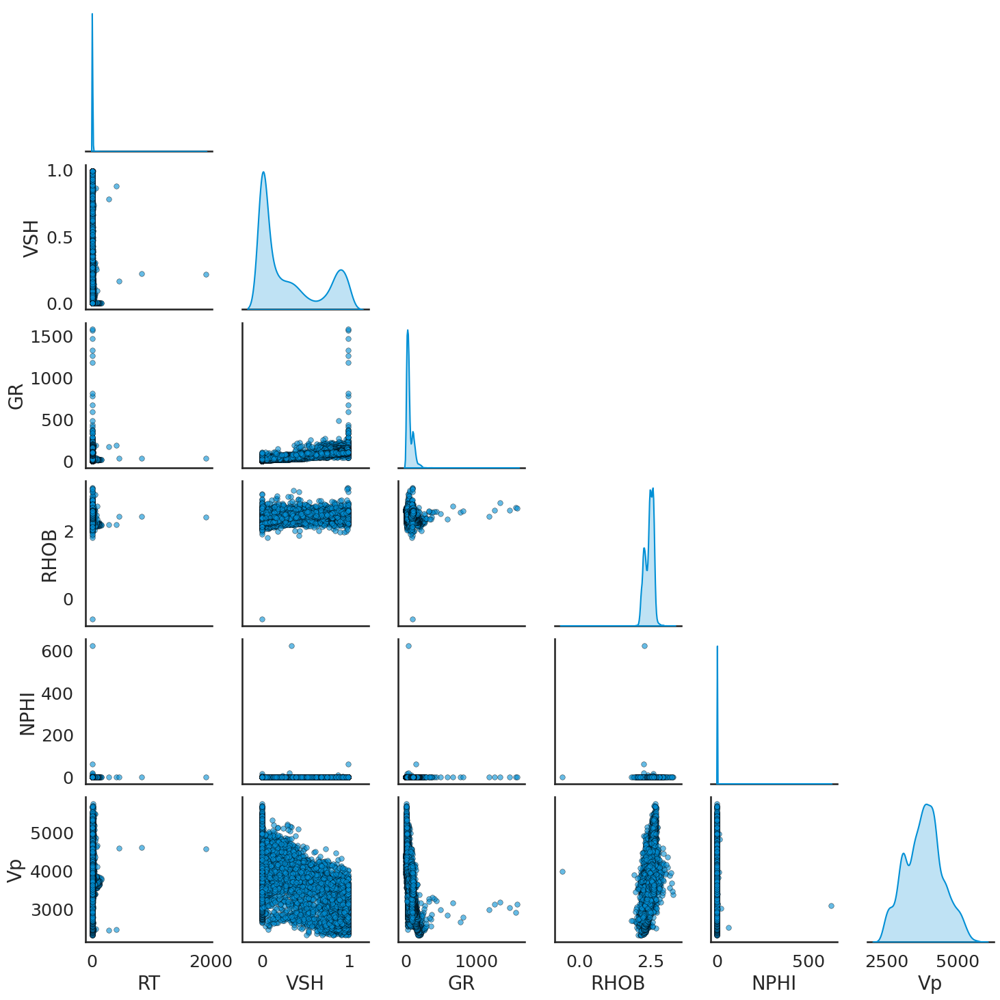

In [24]:
#train_features = ['DEPTH','GR',	'RHOB',	'VSH',	'NPHI',	'VP', 'VS']
sns.set_context("talk", font_scale=1.1)
sns.pairplot(well_train, vars=feature_target, diag_kind='kde',
             plot_kws = {'alpha': 0.6, 's': 30, 'edgecolor': 'k'},corner=True)


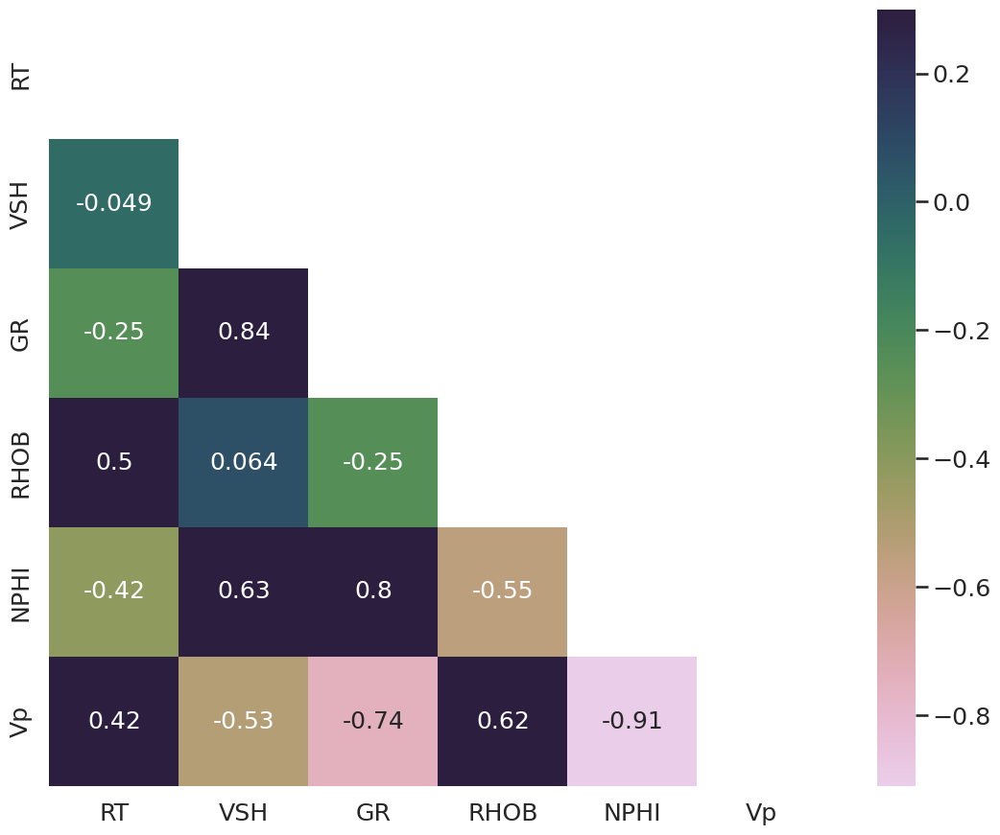

In [25]:
plt.rcParams.update({'font.size': 18})
well_train_only_features = well_train[feature_target]

# Generate a mask for the upper triangle
mask = np.zeros_like(well_train_only_features.corr(method = 'spearman'))
mask[np.triu_indices_from(mask)] = True

# Generate a custom diverging colormap
cmap = sns.cubehelix_palette(n_colors=12, start=-2.25, rot=-1.3, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
plt.figure(figsize=(12,10))
sns.heatmap(well_train_only_features.corr(method = 'spearman') ,annot=True,  mask=mask, cmap=cmap, vmax=.3, square=True,)

plt.show()

In [26]:
col = ['DEPTH']
DEPTH = well_train[col]

In [27]:
well_train.drop(columns=['DEPTH'], inplace=True)
well_train.describe()

,GR,RHOB,RT,VSH,NPHI,VS,Vp
count,10677.00,10677.00,10677.00,10677.00,10677.00,10677.00,10677.00
mean,51.26,2.43,4.34,0.30,0.28,2028.28,3796.13
std,56.78,0.15,23.30,0.36,6.06,383.91,654.44
min,0.00,-0.60,0.07,0.00,0.01,984.21,2309.88
25%,17.21,2.31,1.02,0.00,0.13,1713.88,3331.28
50%,34.04,2.46,1.87,0.12,0.19,2105.94,3815.28
75%,71.95,2.55,3.68,0.59,0.27,2352.03,4201.36
max,1582.59,3.28,1920.75,0.99,622.93,2853.77,5743.30


In [28]:
well_train_copy = well_train.copy()

In [29]:
features = ['GR',	'RHOB',	'RT',	'VSH',	'NPHI',	'Vp',	'VS']
well_train = well_train[features]
well_train.describe()

,GR,RHOB,RT,VSH,NPHI,Vp,VS
count,10677.00,10677.00,10677.00,10677.00,10677.00,10677.00,10677.00
mean,51.26,2.43,4.34,0.30,0.28,3796.13,2028.28
std,56.78,0.15,23.30,0.36,6.06,654.44,383.91
min,0.00,-0.60,0.07,0.00,0.01,2309.88,984.21
25%,17.21,2.31,1.02,0.00,0.13,3331.28,1713.88
50%,34.04,2.46,1.87,0.12,0.19,3815.28,2105.94
75%,71.95,2.55,3.68,0.59,0.27,4201.36,2352.03
max,1582.59,3.28,1920.75,0.99,622.93,5743.30,2853.77


In [30]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer

# transform the RT to logarithmic
#well_train['RT'] = np.log10(well_train['RT'])
#well_train['NPHI'] = np.log10(well_train['NPHI'])

In [31]:
scaler = PowerTransformer(method='yeo-johnson')
ct = ColumnTransformer([('transform', scaler, features)], remainder='passthrough')

scaled_data = ct.fit_transform(well_train)

well_train_norm = pd.DataFrame(scaled_data,columns= features)
well_train_norm


,GR,RHOB,RT,VSH,NPHI,Vp,VS
0,0.03,0.13,-0.05,0.28,-0.42,0.29,-0.35
1,0.03,0.18,-0.07,0.26,-0.24,0.25,-0.40
2,-0.16,0.22,-0.09,-0.23,-0.14,0.20,-0.43
3,-0.19,0.04,-0.11,-0.33,-0.15,0.16,-0.40
4,-0.29,0.03,-0.11,-0.61,-0.27,0.14,-0.34
...,...,...,...,...,...,...,...
10672,1.15,0.93,-0.54,1.46,0.99,-0.17,-0.87
10673,1.18,0.63,-0.57,1.48,1.00,-0.07,-0.88
10674,1.16,0.52,-0.55,1.47,1.07,-0.05,-0.90
10675,1.20,0.66,-0.50,1.50,0.89,-0.12,-0.93


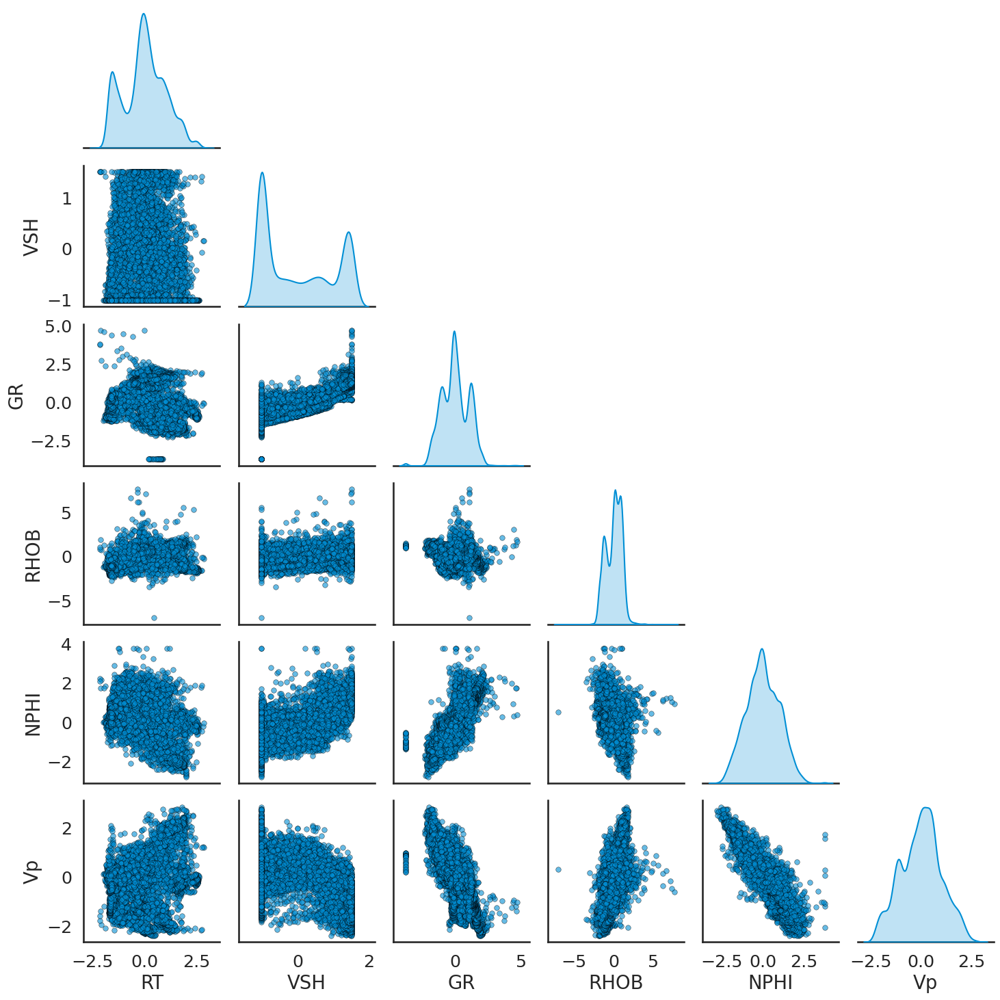

In [32]:
sns.set_context("talk", font_scale=1.1)
sns.pairplot(well_train_norm, vars=feature_target, diag_kind='kde',
             plot_kws = {'alpha': 0.6, 's': 30, 'edgecolor': 'k'},corner=True)

In [33]:
#well_train_norm.reset_index(drop=True, inplace=True)
DEPTH.reset_index(drop=True, inplace=True)

In [34]:
well_train_ = pd.concat([DEPTH, well_train_norm], axis=1)


In [35]:
well_train_

,DEPTH,GR,RHOB,RT,VSH,NPHI,Vp,VS
0,3500.02,0.03,0.13,-0.05,0.28,-0.42,0.29,-0.35
1,3500.17,0.03,0.18,-0.07,0.26,-0.24,0.25,-0.40
2,3500.32,-0.16,0.22,-0.09,-0.23,-0.14,0.20,-0.43
3,3500.48,-0.19,0.04,-0.11,-0.33,-0.15,0.16,-0.40
4,3500.63,-0.29,0.03,-0.11,-0.61,-0.27,0.14,-0.34
...,...,...,...,...,...,...,...,...
10672,4220.26,1.15,0.93,-0.54,1.46,0.99,-0.17,-0.87
10673,4220.41,1.18,0.63,-0.57,1.48,1.00,-0.07,-0.88
10674,4220.57,1.16,0.52,-0.55,1.47,1.07,-0.05,-0.90
10675,4220.72,1.20,0.66,-0.50,1.50,0.89,-0.12,-0.93


In [36]:
well_train_drop = well_train_norm.copy()

In [37]:
from sklearn.ensemble import IsolationForest
from sklearn.covariance import EllipticEnvelope
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

# Method 1: Standard Deviation Method (traditional)
well_train_std = well_train_drop[np.abs(well_train_drop - well_train_drop.mean()) <= (3 * well_train_drop.std())]

## delete all rows that have NaNs
well_train_std = well_train_std.dropna()

# Method 2: Isolation Forest
iso = IsolationForest(contamination=0.2)
yhat = iso.fit_predict(well_train_drop)
mask = yhat != -1
well_train_iso = well_train_norm[mask]




# Method 3: Minimum Covariance Determinant
ee = EllipticEnvelope(contamination=0.2)
yhat = ee.fit_predict(well_train_drop)
mask = yhat != -1
well_train_ee = well_train_norm[mask]

# Method 4: Local Outlier Factor
lof = LocalOutlierFactor(contamination=0.2)
yhat = lof.fit_predict(well_train_drop)
mask = yhat != -1
well_train_lof = well_train_norm[mask]

# Method 5: One-class SVM
svm = OneClassSVM(nu=0.2)
yhat = svm.fit_predict(well_train_drop)
mask = yhat != -1
well_train_svm = well_train_norm[mask]

In [38]:

from sklearn.cluster import DBSCAN
eps = 1 # Maximum distance between two samples for one to be considered as in the neighborhood of the other
min_samples = 5  # The number of samples (or total weight) in a neighborhood for a point to be considered as a core point
dbscan = DBSCAN(eps=eps, min_samples=min_samples)

# Fit the model and predict cluster labels
labels = dbscan.fit_predict(well_train_drop)

# Separate outliers (label -1) from clustered data (labels >= 0)
outliers = well_train_drop[labels == -1]
well_train_DBSCAN = well_train_drop[labels >= 0]


Number of points before outliers removed                       : 10677
Number of points after outliers removed with Isolation Forest  : 8541
Number of points after outliers removed with Outlier Factor    : 8541
Number of points after outliers removed with One-class SVM     : 8541
Number of points after outliers removed with Min. Covariance   : 8541
Number of points after outliers removed with Standard Deviation: 10584
Number of points after outliers removed with DBSCAN            : 10577


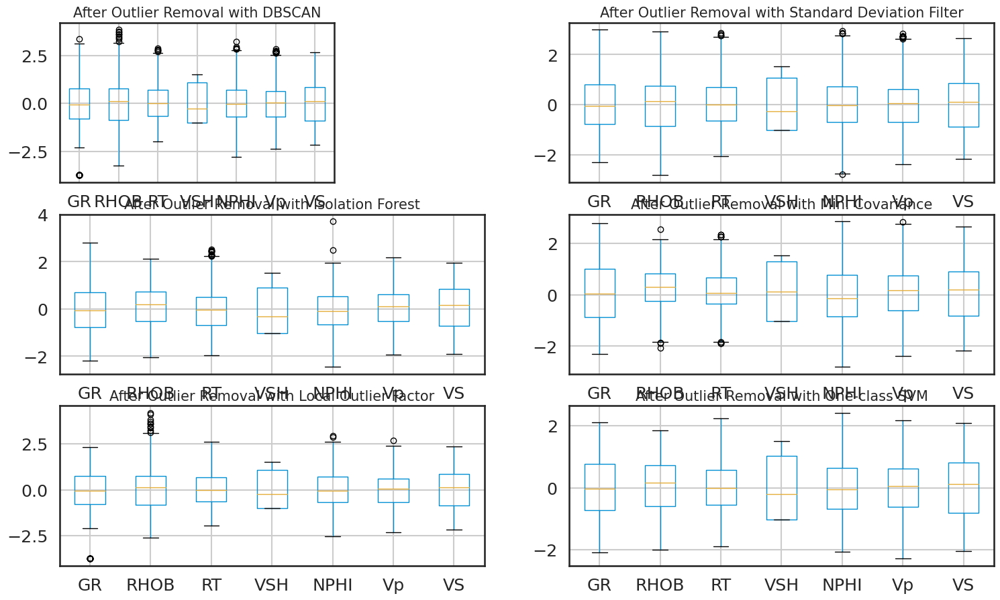

In [39]:
print('Number of points before outliers removed                       :', len(well_train_norm))
print('Number of points after outliers removed with Isolation Forest  :', len(well_train_iso))
print('Number of points after outliers removed with Outlier Factor    :', len(well_train_lof))
print('Number of points after outliers removed with One-class SVM     :', len(well_train_svm))
print('Number of points after outliers removed with Min. Covariance   :', len(well_train_ee))
print('Number of points after outliers removed with Standard Deviation:', len(well_train_std))
print('Number of points after outliers removed with DBSCAN            :', len(well_train_DBSCAN))

plt.figure(figsize=(16,10))

plt.subplot(3,2,1)
well_train_norm[features].boxplot()
plt.title('Before Outlier Removal', size=15)

plt.subplot(3,2,2)
well_train_std[features].boxplot()
plt.title('After Outlier Removal with Standard Deviation Filter', size=15)

plt.subplot(3,2,3)
well_train_iso[features].boxplot()
plt.title('After Outlier Removal with Isolation Forest', size=15)

plt.subplot(3,2,4)
well_train_ee[features].boxplot()
plt.title('After Outlier Removal with Min. Covariance', size=15)

plt.subplot(3,2,5)
well_train_lof[features].boxplot()
plt.title('After Outlier Removal with Local Outlier Factor', size=15)

plt.subplot(3,2,6)
well_train_svm[features].boxplot()
plt.title('After Outlier Removal with One-class SVM', size=15)

plt.subplot(3,3,1)
well_train_DBSCAN[features].boxplot()
plt.title('After Outlier Removal with DBSCAN', size=15)


plt.tight_layout()
plt.show()

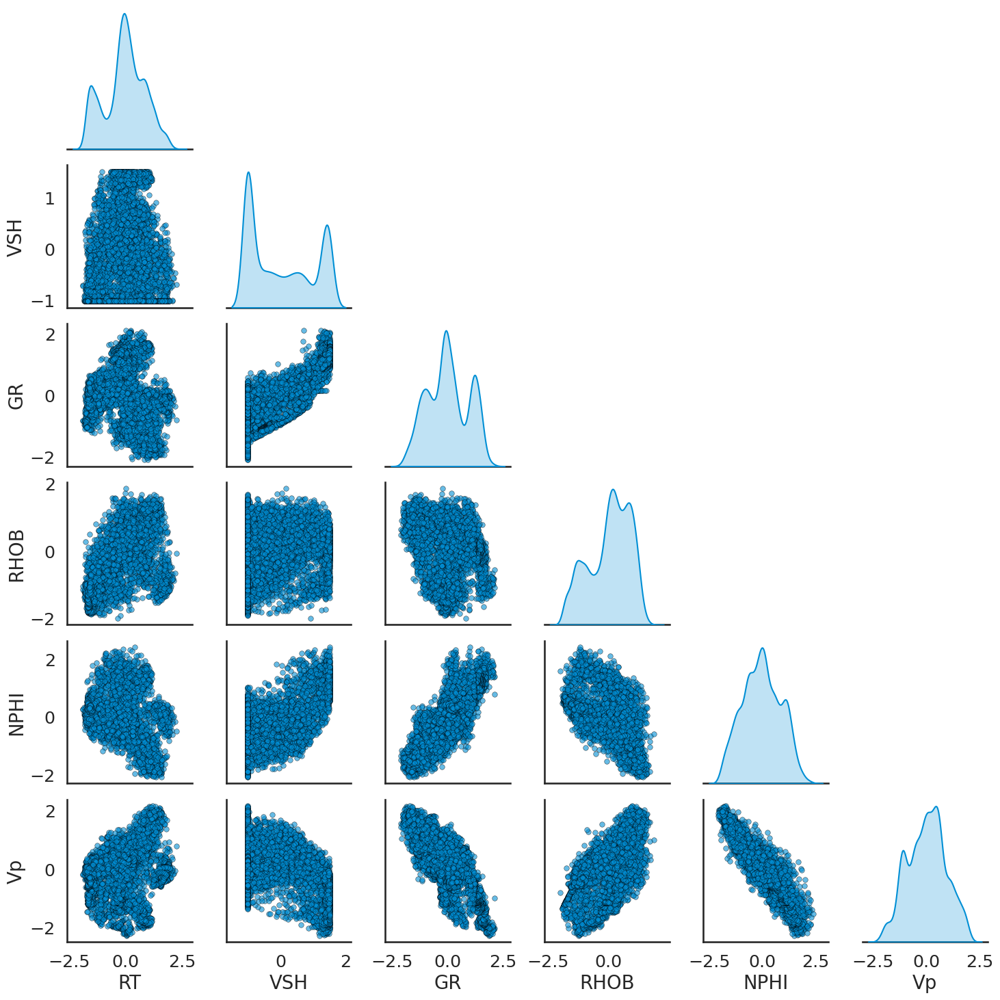

In [40]:
#sns.pairplot(well_train_svm)
#train_features = ['DEPTH','GR',	'RHOB',	'VSH',	'NPHI',	'VP', 'VS']
sns.set_context("talk", font_scale=1.1)
sns.pairplot(well_train_svm, vars=feature_target, diag_kind='kde',
             plot_kws = {'alpha': 0.6, 's': 30, 'edgecolor': 'k'},corner=True)

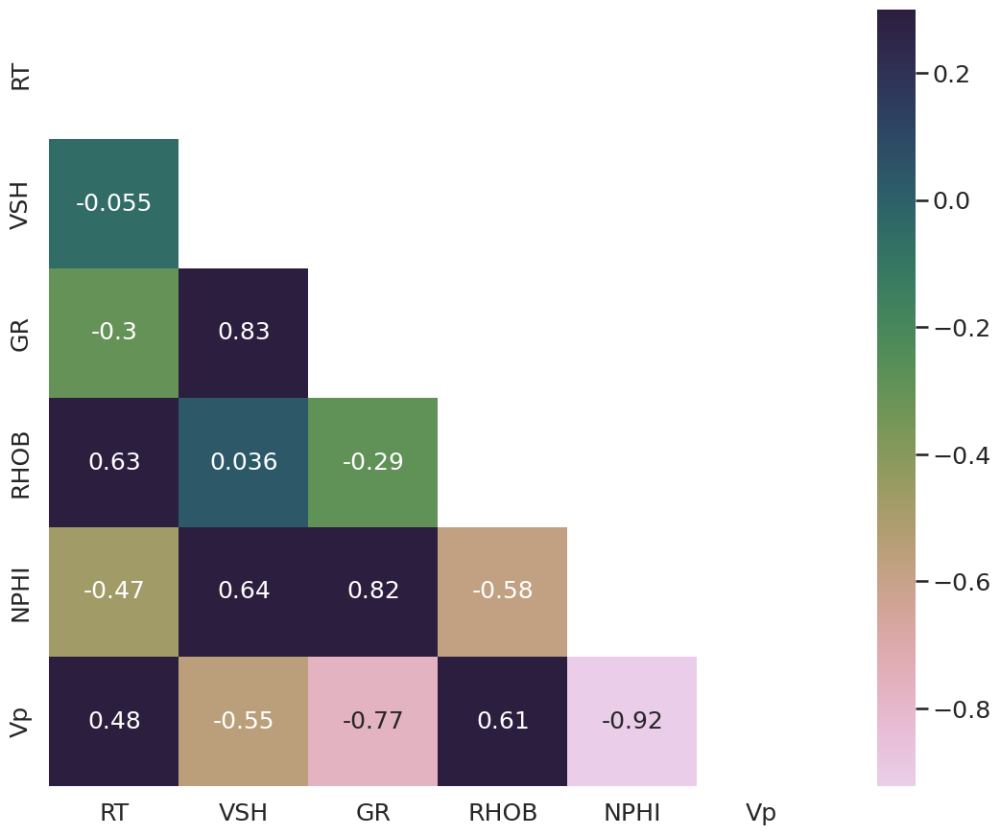

In [41]:
plt.rcParams.update({'font.size': 18})
well_train_only_features = well_train_svm[feature_target]

# Generate a mask for the upper triangle
mask = np.zeros_like(well_train_only_features.corr(method = 'spearman'))
mask[np.triu_indices_from(mask)] = True

# Generate a custom diverging colormap
cmap = sns.cubehelix_palette(n_colors=12, start=-2.25, rot=-1.3, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
plt.figure(figsize=(12,10))
sns.heatmap(well_train_only_features.corr(method = 'spearman') ,annot=True,  mask=mask, cmap=cmap, vmax=.3, square=True,)

plt.show()

In [42]:
plt.rcParams.update({'font.size': 25})
plt.style.use("seaborn-white")
sns.set_style("white")

In [43]:
feaatur = ['GR',	'RHOB',	'RT',	'VSH',	'NPHI',	'Vp']

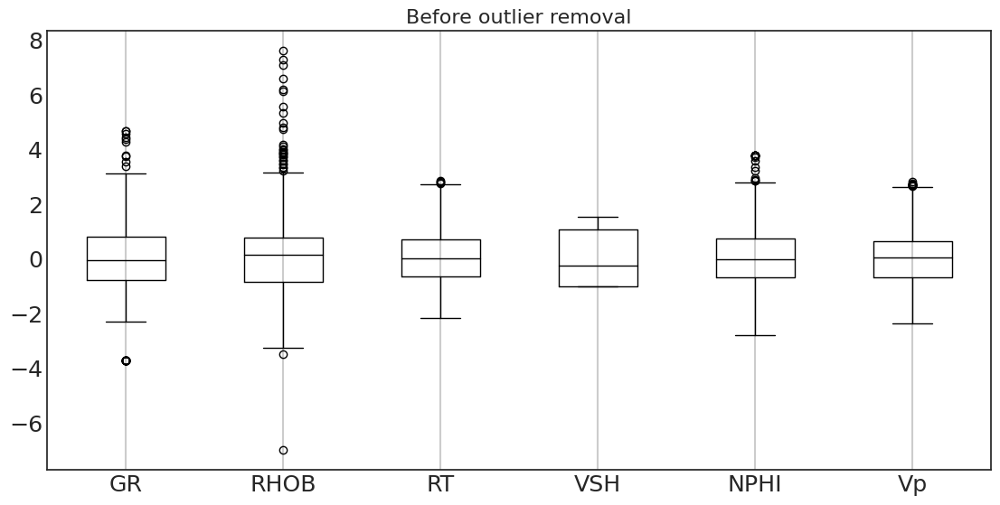

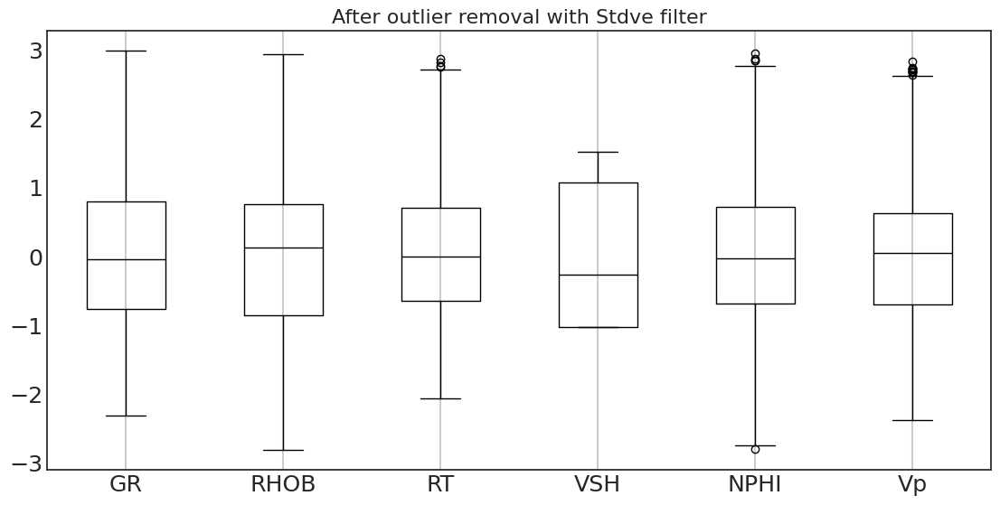

In [44]:
plt.figure(figsize=(12,6))
well_train_norm[feaatur].boxplot(color = 'black')
plt.title('Before outlier removal', size=16)
plt.grid( axis = 'y')

plt.figure(figsize=(12,6))
well_train_std[feaatur].boxplot(color = 'black')
plt.title('After outlier removal with Stdve filter', size=16)
plt.grid( axis = 'y')

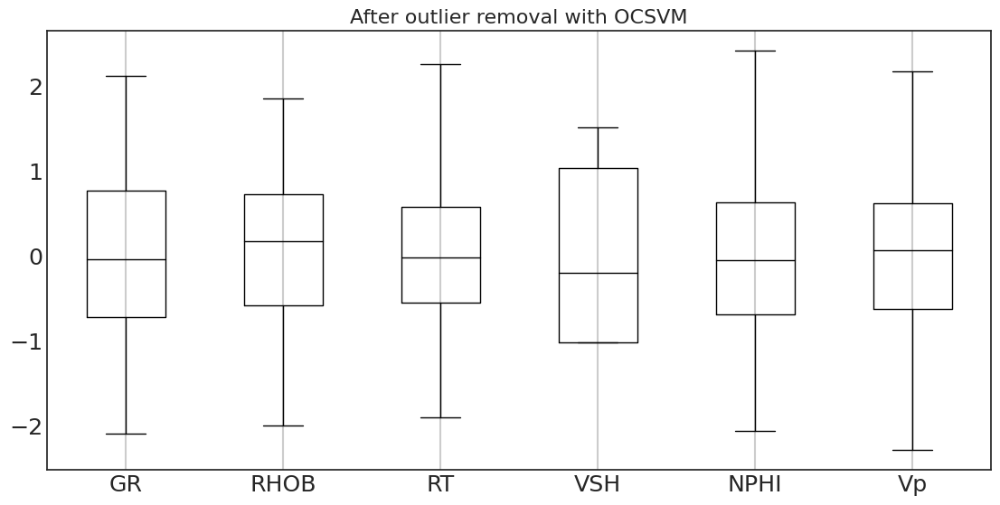

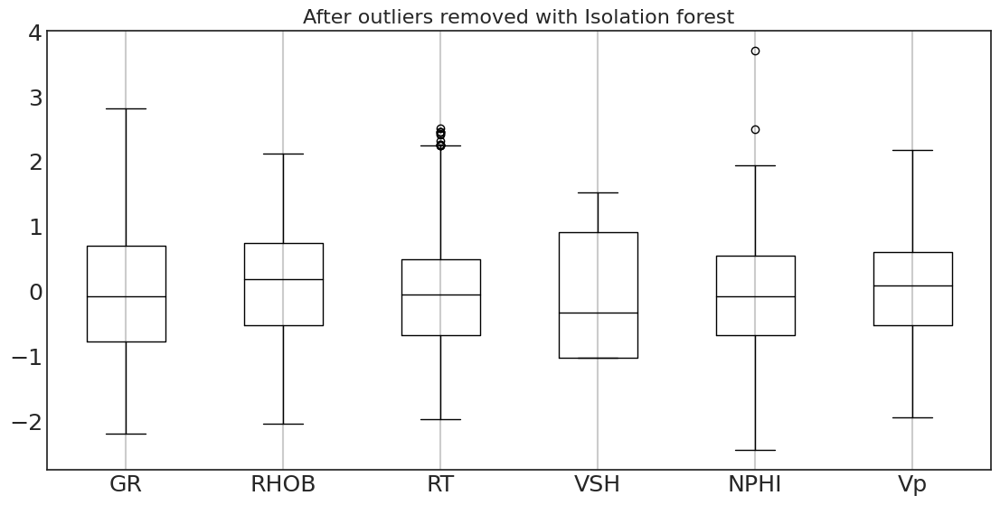

In [45]:
plt.figure(figsize=(12,6))
well_train_svm[feaatur].boxplot(color = 'black')
plt.title('After outlier removal with OCSVM', size=16)
plt.grid( axis = 'y')

plt.figure(figsize=(12,6))
well_train_iso[feaatur].boxplot(color = 'black')
plt.title('After outliers removed with Isolation forest', size=16)
plt.grid( axis = 'y')

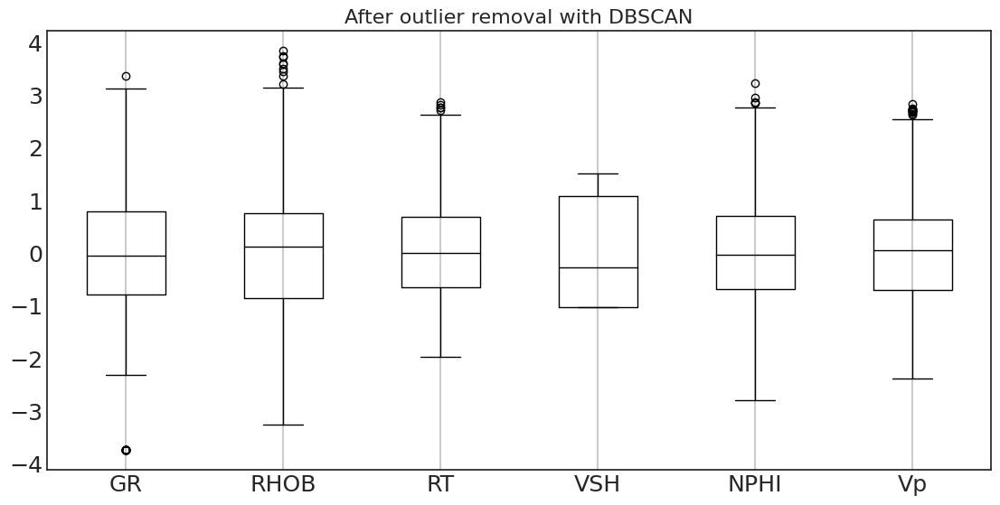

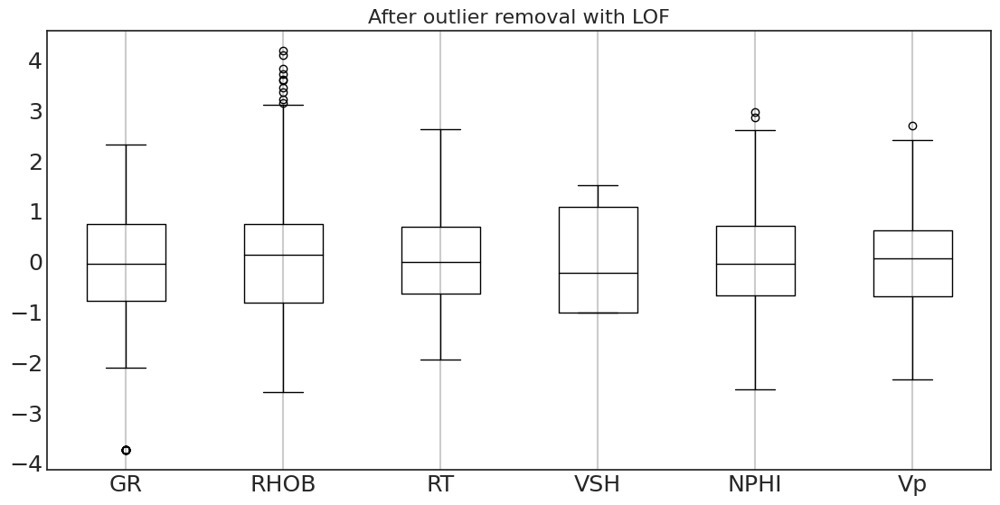

In [46]:
plt.figure(figsize=(12,6))
well_train_DBSCAN[feaatur].boxplot(color = 'black')
plt.title('After outlier removal with DBSCAN', size=16)
plt.grid( axis = 'y')
plt.figure(figsize=(12,6))
well_train_lof[feaatur].boxplot(color = 'black')
plt.title('After outlier removal with LOF', size=16)
plt.grid( axis = 'y')

In [47]:
train_features = ['GR',	'RHOB',	'RT',	'VSH',	'NPHI']
target_feature = 'Vp'

In [48]:
X = well_train_norm[train_features]
y = well_train_norm[target_feature]  #compressinal


In [49]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn import metrics

In [50]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [51]:
print('Shape of Training X:', X_train.shape)
print('Shape of Training y:', y_train.shape)
print('Shape of Test X:', X_test.shape)
print('Shape of Test y:', y_test.shape)

Shape of Training X: (8007, 5)
Shape of Training y: (8007,)
Shape of Test X: (2670, 5)
Shape of Test y: (2670,)


In [52]:
def reg_metrics(test, pred):
    '''Function returns basic metrics for regression models'''
    print('Mean Absolute Error:', metrics.mean_absolute_error(test, pred))
    print('Mean Squared Error:', metrics.mean_squared_error(test, pred))
    print('Root Mean Squared Error:', np.sqrt(
        metrics.mean_squared_error(test, pred)))
    print('R Squared:', (metrics.r2_score(test, pred)))

def reg_plot(test, pred):
    '''Function returns a regression plot, in the form of a scatter plot'''
    sns.regplot(x=test, y=pred, scatter_kws={
                "color": "black"}, line_kws={"color": "red"})
    plt.xlim(0, max(test))
    plt.title('Regression Results')
    plt.xlabel('Test Data')
    plt.ylabel('Model Prediction')
    plt.figure(figsize=(10,5))
    plt.show()

# Linear Model

In [53]:
LR_regressor = LinearRegression()
LR_regressor.fit(X_train, y_train)

# Making predictions on the test set
y_pred_LR = LR_regressor.predict(X_test)
reg_metrics(y_test, y_pred_LR)

Mean Absolute Error: 0.2710478411891835
Mean Squared Error: 0.13193745341258184
Root Mean Squared Error: 0.36323195538468506
R Squared: 0.8700397238623483


In [54]:
from sklearn.metrics import make_scorer, r2_score
from sklearn.model_selection import KFold, cross_val_score
r2_scorer = make_scorer(r2_score)
kf = 4
# Perform K-fold cross-validation with R-squared scoring
cv_results = cross_val_score(LR_regressor, X_train, y_train, cv=kf, scoring=r2_scorer)
print(f'R-squared for each fold: {cv_results}')
print(f'Mean R-squared: {cv_results.mean()}')

R-squared for each fold: [0.8800761  0.87332761 0.85526485 0.86601244]
Mean R-squared: 0.8686702514731937


In [55]:
# Initialize the SVM regressor
svm_regressor = SVR(kernel='linear')

# Train the SVM regressor
svm_regressor.fit(X_train, y_train)

# Predict the target values for the test set
y_pred_SVM = svm_regressor.predict(X_test)
reg_metrics(y_test, y_pred_SVM)

Mean Absolute Error: 0.2683528539274047
Mean Squared Error: 0.1341945262315981
Root Mean Squared Error: 0.36632571057953073
R Squared: 0.8678164748967581


In [56]:
cv_results = cross_val_score(svm_regressor, X_train, y_train, cv=kf, scoring=r2_scorer)
print(f'R-squared for each fold: {cv_results}')
print(f'Mean R-squared: {cv_results.mean()}')

R-squared for each fold: [0.87888138 0.87287836 0.85178212 0.86325573]
Mean R-squared: 0.8666993972631041


In [57]:
# Initialize the SVM regressor
svm_regressorrbf = SVR(kernel='rbf')

# Train the SVM regressor
svm_regressorrbf.fit(X_train, y_train)

# Predict the target values for the test set
y_pred_SVM = svm_regressorrbf.predict(X_test)
reg_metrics(y_test, y_pred_SVM)

Mean Absolute Error: 0.17523339078768338
Mean Squared Error: 0.06836369431312293
Root Mean Squared Error: 0.26146451826801076
R Squared: 0.9326607846299676


In [58]:
cv_results = cross_val_score(svm_regressorrbf, X_train, y_train, cv=kf, scoring=r2_scorer)
print(f'R-squared for each fold: {cv_results}')
print(f'Mean R-squared: {cv_results.mean()}')

R-squared for each fold: [0.93744585 0.93167287 0.92038916 0.92823378]
Mean R-squared: 0.9294354147754393


In [59]:
# Initialize the Ridge Regression model
ridge_reg = Ridge(alpha=1.0)  # Alpha is the regularization strength, higher values specify stronger regularization

# Train the Ridge Regression model
ridge_reg.fit(X_train, y_train)

# Predict the target values for the test set
y_pred_R = ridge_reg.predict(X_test)
reg_metrics(y_test, y_pred_R)

Mean Absolute Error: 0.2710519279095298
Mean Squared Error: 0.13193371139869275
Root Mean Squared Error: 0.3632268043505225
R Squared: 0.870043409799478


In [60]:
cv_results = cross_val_score(ridge_reg, X_train, y_train, cv=kf, scoring=r2_scorer)
print(f'R-squared for each fold: {cv_results}')
print(f'Mean R-squared: {cv_results.mean()}')

R-squared for each fold: [0.88007484 0.87332908 0.85526499 0.8660124 ]
Mean R-squared: 0.8686703258852845


In [61]:
lasso_reg = Lasso(alpha=1.0, random_state=42)  # Alpha is the regularization strength

# Train the Lasso Regression model
lasso_reg.fit(X_train, y_train)

# Predict the target values for the test set
y_pred = lasso_reg.predict(X_test)

reg_metrics(y_test, y_pred)

Mean Absolute Error: 0.8107708870269439
Mean Squared Error: 1.0154516276607415
Root Mean Squared Error: 1.0076961980977905
R Squared: -0.00023435743101174467


In [62]:
cv_results = cross_val_score(lasso_reg, X_train, y_train, cv=kf, scoring=r2_scorer)
print(f'R-squared for each fold: {cv_results}')
print(f'Mean R-squared: {cv_results.mean()}')

R-squared for each fold: [-3.16923184e-03 -9.00807658e-04 -2.45361597e-05 -1.01799980e-03]
Mean R-squared: -0.001278143863348069


In [63]:
# Initialize the ElasticNet Regression model
elastic_net_reg = ElasticNet(alpha=1.0, l1_ratio=0.5, random_state=42)
# Alpha is the regularization strength, l1_ratio controls the balance between L1 and L2 penalties

# Train the ElasticNet Regression model
elastic_net_reg.fit(X_train, y_train)

# Predict the target values for the test set
y_pred_net = elastic_net_reg.predict(X_test)

reg_metrics(y_test, y_pred_net)

Mean Absolute Error: 0.6062102995852128
Mean Squared Error: 0.5698972866915956
Root Mean Squared Error: 0.754915416912117
R Squared: 0.43864303249106584


In [64]:
cv_results = cross_val_score(elastic_net_reg, X_train, y_train, cv=kf, scoring=r2_scorer)
print(f'R-squared for each fold: {cv_results}')
print(f'Mean R-squared: {cv_results.mean()}')

R-squared for each fold: [0.4278541  0.42859988 0.43922231 0.44093555]
Mean R-squared: 0.43415296029418116


# Non linear model

In [65]:
modelRF = RandomForestRegressor(max_depth=20, n_estimators=300,random_state=42)  # You can adjust n_estimators and other hyperparameters
modelRF.fit(X_train, y_train)

# Make predictions on the testing set
y_pred_RF = modelRF.predict(X_test)

# Calculate the mean squared error
mse = mean_squared_error(y_test, y_pred_RF)

reg_metrics(y_test, y_pred_RF)

Mean Absolute Error: 0.15231279164835973
Mean Squared Error: 0.055181981066573606
Root Mean Squared Error: 0.23490845252262338
R Squared: 0.9456449604585844


In [66]:
cv_results = cross_val_score(modelRF, X_train, y_train, cv=kf, scoring=r2_scorer)
print(f'R-squared for each fold: {cv_results}')
print(f'Mean R-squared: {cv_results.mean()}')

R-squared for each fold: [0.94442246 0.94286994 0.93376359 0.93973821]
Mean R-squared: 0.9401985493209037


In [67]:
# 5. Gradient Boosting Regressor using hyper parameter
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
gb_reg = GradientBoostingRegressor(max_depth=5, n_estimators=100)
gb_reg.fit(X_train, y_train)
y_pred_DT = gb_reg.predict(X_test)
reg_metrics(y_test, y_pred_DT)

Mean Absolute Error: 0.17149756923317316
Mean Squared Error: 0.0620224556480057
Root Mean Squared Error: 0.24904307990387065
R Squared: 0.9389069952900773


In [68]:
cv_results = cross_val_score(gb_reg, X_train, y_train, cv=kf, scoring=r2_scorer)
print(f'R-squared for each fold: {cv_results}')
print(f'Mean R-squared: {cv_results.mean()}')

R-squared for each fold: [0.93963122 0.93665557 0.92648033 0.9323893 ]
Mean R-squared: 0.9337891037471743


In [69]:
# Stacking (Stacked Generalization) for a regression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import StackingRegressor
base_models = [
    ('random_forest', RandomForestRegressor(n_estimators=100, random_state=42)),
    ('k_neighbors', KNeighborsRegressor(n_neighbors=5)),
]

# Initialize the meta regressor (blender)
meta_model = LinearRegression()

# Initialize the stacking regressor
stacking_reg = StackingRegressor(estimators=base_models, final_estimator=meta_model)

# Train the stacking regressor
stacking_reg.fit(X_train, y_train)

# Predict the target values for the test set
y_pred_s = stacking_reg.predict(X_test)

# Calculate the mean squared error of the model
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)
reg_metrics(y_test, y_pred_s)

Mean Squared Error: 1.0154516276607415
Mean Absolute Error: 0.14676065076190073
Mean Squared Error: 0.0516761990021053
Root Mean Squared Error: 0.22732399565841108
R Squared: 0.9490982058668611


In [70]:
cv_results = cross_val_score(stacking_reg, X_train, y_train, cv=kf, scoring=r2_scorer)
print(f'R-squared for each fold: {cv_results}')
print(f'Mean R-squared: {cv_results.mean()}')

R-squared for each fold: [0.94621341 0.94375195 0.9356558  0.94295944]
Mean R-squared: 0.9421451488174227


In [71]:
import tensorflow as tf
from tensorflow import keras

model_s = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(1)  # Output layer with one neuron for regression
])

# Compile the model
model_s.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model_s.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.1)

# Evaluate the model on the test set
loss = model_s.evaluate(X_test, y_test)
print("Test Loss:", loss)

Epoch 1/20
226/226 [==============================] - 2s 3ms/step - loss: 0.1323 - val_loss: 0.0856
Epoch 2/20
226/226 [==============================] - 0s 2ms/step - loss: 0.0841 - val_loss: 0.0754
Epoch 3/20
226/226 [==============================] - 1s 2ms/step - loss: 0.0801 - val_loss: 0.0742
Epoch 4/20
226/226 [==============================] - 1s 2ms/step - loss: 0.0775 - val_loss: 0.0710
Epoch 5/20
226/226 [==============================] - 1s 2ms/step - loss: 0.0747 - val_loss: 0.0696
Epoch 6/20
226/226 [==============================] - 0s 2ms/step - loss: 0.0730 - val_loss: 0.0686
Epoch 7/20
226/226 [==============================] - 1s 2ms/step - loss: 0.0720 - val_loss: 0.0657
Epoch 8/20
226/226 [==============================] - 1s 3ms/step - loss: 0.0706 - val_loss: 0.0668
Epoch 9/20
226/226 [==============================] - 1s 2ms/step - loss: 0.0698 - val_loss: 0.0637
Epoch 10/20
226/226 [==============================] - 0s 2ms/step - loss: 0.0686 - val_loss: 0.0623

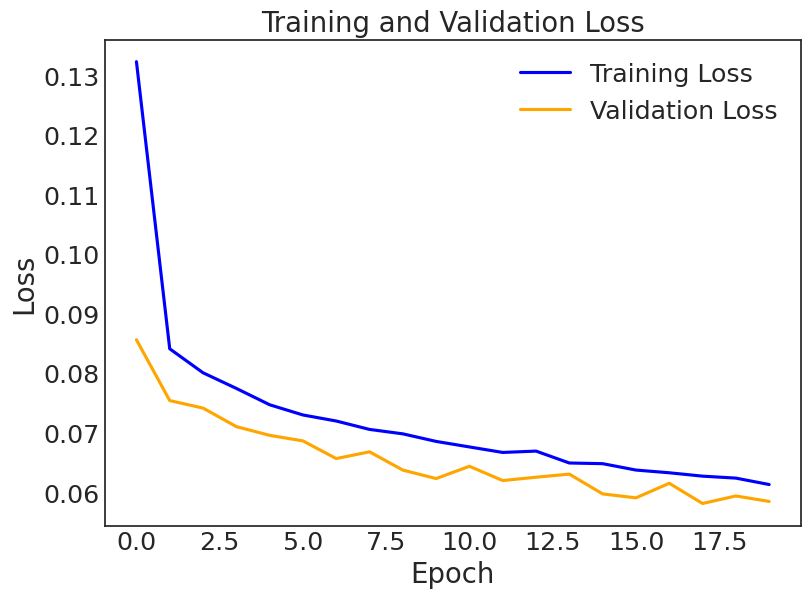

In [72]:
# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot training and validation loss
plt.figure(figsize=(8, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [73]:
y_pred_s = model_s.predict(X_test)

reg_metrics(y_test, y_pred_s)

84/84 [==============================] - 0s 2ms/step
Mean Absolute Error: 0.17759099902516426
Mean Squared Error: 0.06588247845677181
Root Mean Squared Error: 0.2566758236701926
R Squared: 0.9351048176888758


In [74]:
import tensorflow as tf
from tensorflow import keras

model = keras.Sequential([
    keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(16, activation='relu'),
    keras.layers.Dense(8, activation='relu'),
    keras.layers.Dense(4, activation='relu'),   # Additional hidden layer
    keras.layers.Dense(2, activation='relu'),   # Additional hidden layer
    keras.layers.Dense(1)  # Output layer with one neuron for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.1)

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print("Test Loss:", loss)


Epoch 1/50
226/226 [==============================] - 3s 3ms/step - loss: 0.3438 - val_loss: 0.1087
Epoch 2/50
226/226 [==============================] - 1s 3ms/step - loss: 0.0969 - val_loss: 0.0804
Epoch 3/50
226/226 [==============================] - 1s 3ms/step - loss: 0.0865 - val_loss: 0.0747
Epoch 4/50
226/226 [==============================] - 1s 3ms/step - loss: 0.0814 - val_loss: 0.0697
Epoch 5/50
226/226 [==============================] - 1s 3ms/step - loss: 0.0791 - val_loss: 0.0680
Epoch 6/50
226/226 [==============================] - 1s 3ms/step - loss: 0.0767 - val_loss: 0.0682
Epoch 7/50
226/226 [==============================] - 1s 3ms/step - loss: 0.0737 - val_loss: 0.0651
Epoch 8/50
226/226 [==============================] - 1s 3ms/step - loss: 0.0731 - val_loss: 0.0651
Epoch 9/50
226/226 [==============================] - 1s 3ms/step - loss: 0.0718 - val_loss: 0.0620
Epoch 10/50
226/226 [==============================] - 1s 3ms/step - loss: 0.0704 - val_loss: 0.0667

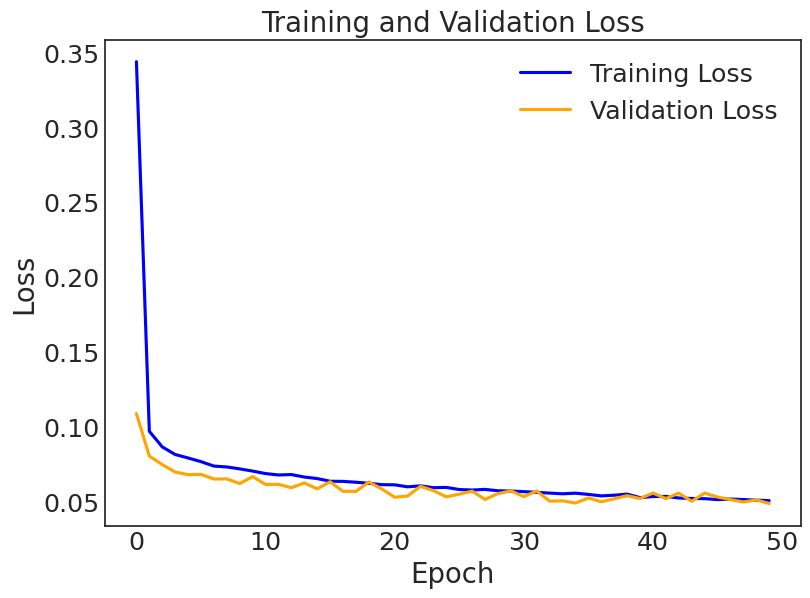

In [75]:
# Get training and validation loss values from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot training and validation loss
plt.figure(figsize=(8, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [76]:
y_pred_ann = model.predict(X_test)

reg_metrics(y_test, y_pred_ann)

84/84 [==============================] - 0s 3ms/step
Mean Absolute Error: 0.16392318794565078
Mean Squared Error: 0.05826132724535707
Root Mean Squared Error: 0.24137383297565018
R Squared: 0.9426117604886965


In [77]:
from sklearn.metrics import make_scorer, r2_score
from sklearn.model_selection import KFold, cross_val_score
r2_scorer = make_scorer(r2_score)
kf = 4
# Perform K-fold cross-validation with R-squared scoring
cv_results = cross_val_score(stacking_reg, X_train, y_train, cv=kf, scoring=r2_scorer)
print(f'R-squared for each fold: {cv_results}')
print(f'Mean R-squared: {cv_results.mean()}')

R-squared for each fold: [0.94621341 0.94375195 0.9356558  0.94295944]
Mean R-squared: 0.9421451488174227


# prediction

In [78]:
well3.describe()

,DEPTH,LFP_AI_B,LFP_AI_G,LFP_AI_O,LFP_AI_V,LFP_API,LFP_BADDATA,LFP_BS,LFP_BVWE,LFP_BVWT,...,LFP_VS_GC,LFP_VS_O,LFP_VS_V,LFP_VSH,LFP_VSHDN,LFP_VSHDRY,LFP_VSHDRYC,LFP_VSHDRYWC,LFP_VSHGR,LFP_WATER
count,39257.00,3308.00,3308.00,3308.00,3308.00,3729.00,3729.00,36280.00,3309.00,3309.00,...,3313.00,3308.00,3308.00,3309.00,3309.00,3309.00,3309.00,3309.00,3309.00,3729.00
mean,2558.62,10022.23,9737.24,9855.49,9994.40,0.90,0.09,13.94,0.08,0.10,...,2314.95,2319.81,2314.45,0.35,0.48,0.33,0.33,0.33,0.47,0.00
std,1416.58,1554.64,1874.98,1737.32,1587.72,0.00,0.29,5.46,0.06,0.07,...,394.39,389.37,393.24,0.20,0.25,0.19,0.19,0.19,0.35,0.00
min,105.12,5513.25,4431.30,4954.11,5513.25,0.90,0.00,8.50,0.01,0.01,...,1048.55,1048.55,1048.55,0.00,-1.05,0.00,0.00,0.00,-0.04,0.00
25%,1331.88,8933.43,8360.64,8612.81,8895.83,0.90,0.00,12.25,0.03,0.05,...,2081.51,2090.97,2081.37,0.20,0.32,0.19,0.19,0.19,0.27,0.00
50%,2558.62,10141.47,10112.07,10117.44,10141.47,0.90,0.00,12.25,0.06,0.09,...,2309.28,2311.94,2309.07,0.34,0.49,0.31,0.31,0.31,0.42,0.00
75%,3785.38,10779.71,10769.23,10770.95,10779.71,0.90,0.00,17.50,0.10,0.14,...,2484.70,2484.66,2482.60,0.48,0.60,0.45,0.45,0.45,0.57,0.00
max,5012.12,15595.15,15595.15,15595.15,15595.15,0.90,1.00,36.00,0.37,0.37,...,3923.39,3923.39,3923.39,0.99,1.81,0.97,0.97,0.97,3.07,0.00


In [79]:
#a = well3['LFP_VP_V'].values #   , 'LFP_VP_G', 'LFP_VP_O', 'LFP_VP_V'
#b = well3['LFP_VP_G'].values
#plt.scatter(a,b)

In [80]:
print(list(well3.columns))

['DEPTH', 'LFP_AI_B', 'LFP_AI_G', 'LFP_AI_O', 'LFP_AI_V', 'LFP_API', 'LFP_BADDATA', 'LFP_BS', 'LFP_BVWE', 'LFP_BVWT', 'LFP_CALI', 'LFP_COAL', 'LFP_DT', 'LFP_DT_B', 'LFP_DT_G', 'LFP_DT_LOG', 'LFP_DT_O', 'LFP_DT_SYNT', 'LFP_DT_V', 'LFP_DTCORFSFLAG', 'LFP_DTLOGFLAG', 'LFP_DTS', 'LFP_DTS_B', 'LFP_DTS_G', 'LFP_DTS_GC', 'LFP_DTS_O', 'LFP_DTS_V', 'LFP_DTSLOGFLAG', 'LFP_EI_HILT_B', 'LFP_EI_HILT_G', 'LFP_EI_HILT_O', 'LFP_EI_HILT_V', 'LFP_GAS', 'LFP_GOR', 'LFP_GR', 'LFP_GRMAX', 'LFP_GRMIN', 'LFP_KFLG', 'LFP_KFLMF', 'LFP_KFLO', 'LFP_KFLW', 'LFP_KROCKV', 'LFP_KRROCKV', 'LFP_KSKEL', 'LFP_KVROCKV', 'LFP_MODEL', 'LFP_NPHI', 'LFP_NPHISH', 'LFP_OIL', 'LFP_PHIE', 'LFP_PHIEC', 'LFP_PHIEWC', 'LFP_PHIT', 'LFP_PHITC', 'LFP_PHITWC', 'LFP_PR', 'LFP_PR_B', 'LFP_PR_G', 'LFP_PR_O', 'LFP_PR_SH_SYNT', 'LFP_PR_SS_B_SYNT', 'LFP_PR_SS_G_SYNT', 'LFP_PR_SS_O_SYNT', 'LFP_PR_V', 'LFP_PRESS', 'LFP_RHOB', 'LFP_RHOB_B', 'LFP_RHOB_G', 'LFP_RHOB_LOG', 'LFP_RHOB_O', 'LFP_RHOB_SYNT', 'LFP_RHOB_V', 'LFP_RHOBFAR_HILT_B', 'LFP_RHO

In [81]:
train_features = ['DEPTH','LFP_GR',	'LFP_RHOB',	'LFP_RT',	'LFP_VSH',	'LFP_NPHI','LFP_VP_V', 'LFP_VS']
well_3 = well3[train_features] # 'GR',	'RHOB',	'RT',	'VSH',	'NPHI'
well_3.dropna(inplace=True)
well_3.describe()

,DEPTH,LFP_GR,LFP_RHOB,LFP_RT,LFP_VSH,LFP_NPHI,LFP_VP_V,LFP_VS
count,3308.00,3308.00,3308.00,3308.00,3308.00,3308.00,3308.00,3308.00
mean,4382.31,52.56,2.49,23.31,0.35,0.17,4001.73,2314.01
std,119.39,29.08,0.12,312.35,0.20,0.07,495.77,393.94
min,4175.62,12.79,2.06,0.30,0.00,0.04,2489.18,1048.55
25%,4278.97,39.75,2.41,0.98,0.20,0.14,3678.37,2080.83
50%,4382.31,48.97,2.51,1.47,0.34,0.16,4010.96,2309.07
75%,4485.66,59.18,2.58,2.97,0.48,0.20,4227.91,2482.60
max,4589.00,290.61,2.92,8498.65,0.99,0.70,5981.95,3923.39


In [82]:
well_3.rename(columns = {'LFP_GR':'GR', 'LFP_RHOB':'RHOB','LFP_VSH':'VSH','LFP_RT':'RT','LFP_NPHI':'NPHI', 'LFP_VP':'VP'}, inplace = True)

In [83]:
well_3.rename(columns = {'LFP_VP_V':'Vp', 'LFP_VS':'VS'},inplace=True)

In [84]:
well_3.describe()

,DEPTH,GR,RHOB,RT,VSH,NPHI,Vp,VS
count,3308.00,3308.00,3308.00,3308.00,3308.00,3308.00,3308.00,3308.00
mean,4382.31,52.56,2.49,23.31,0.35,0.17,4001.73,2314.01
std,119.39,29.08,0.12,312.35,0.20,0.07,495.77,393.94
min,4175.62,12.79,2.06,0.30,0.00,0.04,2489.18,1048.55
25%,4278.97,39.75,2.41,0.98,0.20,0.14,3678.37,2080.83
50%,4382.31,48.97,2.51,1.47,0.34,0.16,4010.96,2309.07
75%,4485.66,59.18,2.58,2.97,0.48,0.20,4227.91,2482.60
max,4589.00,290.61,2.92,8498.65,0.99,0.70,5981.95,3923.39


In [85]:
well_3 = well_3.loc[(well_3['DEPTH'] >= 4200) & (well_3['DEPTH'] <= 4500)]
well_3.reset_index(drop=True, inplace=True)

In [86]:
well_3

,DEPTH,GR,RHOB,RT,VSH,NPHI,Vp,VS
0,4200.00,22.45,2.68,5.67,0.12,0.05,4730.99,2927.20
1,4200.12,21.04,2.68,5.85,0.10,0.05,4799.14,2985.41
2,4200.25,19.19,2.67,6.08,0.07,0.05,4922.56,3089.21
3,4200.38,18.13,2.67,6.27,0.06,0.04,5007.89,3160.51
4,4200.50,17.51,2.67,6.42,0.05,0.04,5074.69,3215.80
...,...,...,...,...,...,...,...,...
2396,4499.50,45.81,2.51,1.21,0.36,0.16,4623.74,2799.16
2397,4499.62,45.86,2.50,1.18,0.36,0.16,4567.03,2753.72
2398,4499.75,44.84,2.50,1.14,0.33,0.15,4594.88,2780.63
2399,4499.88,43.62,2.50,1.11,0.31,0.15,4665.96,2841.67


In [87]:
col =['DEPTH']
DEPTH = pd.DataFrame(well_3['DEPTH'].values, columns=col)
DEPTH

,DEPTH
0,4200.00
1,4200.12
2,4200.25
3,4200.38
4,4200.50
...,...
2396,4499.50
2397,4499.62
2398,4499.75
2399,4499.88


In [88]:
column = ['True_VP']
True_VP = pd.DataFrame(well_3['Vp'].values, columns=column)
True_VP

,True_VP
0,4730.99
1,4799.14
2,4922.56
3,5007.89
4,5074.69
...,...
2396,4623.74
2397,4567.03
2398,4594.88
2399,4665.96


In [89]:
well_3_test = well_3.drop(['DEPTH','VS','Vp'], axis=1)
test_features = ['GR',	'RHOB',	'RT',	'VSH',	'NPHI']

In [90]:
well_3_test.describe()

,GR,RHOB,RT,VSH,NPHI
count,2401.00,2401.00,2401.00,2401.00,2401.00
mean,53.55,2.47,31.29,0.35,0.18
std,32.99,0.13,366.33,0.21,0.08
min,12.79,2.17,0.30,0.00,0.04
25%,40.47,2.36,0.84,0.19,0.14
50%,47.55,2.50,1.54,0.33,0.18
75%,59.25,2.58,3.04,0.48,0.22
max,290.61,2.92,8498.65,0.99,0.70


In [91]:
ct = ColumnTransformer([('transform', scaler, test_features)], remainder='passthrough')
well_test_norm3 = ct.fit_transform(well_3_test)  ## normalazation of well data

well_test_norm3 = pd.DataFrame(well_test_norm3, columns=test_features)  ## prediction
well_test_norm3

,GR,RHOB,RT,VSH,NPHI
0,-1.89,1.81,1.21,-1.24,-3.20
1,-2.07,1.79,1.23,-1.39,-3.28
2,-2.32,1.74,1.26,-1.60,-3.39
3,-2.47,1.71,1.28,-1.72,-3.45
4,-2.57,1.71,1.30,-1.80,-3.46
...,...,...,...,...,...
2396,-0.08,0.19,-0.39,0.21,-0.17
2397,-0.08,0.13,-0.42,0.22,-0.20
2398,-0.13,0.08,-0.46,0.07,-0.37
2399,-0.20,0.09,-0.48,-0.07,-0.47


# prediction well_3

In [92]:
well2_DT_LR = LR_regressor.predict(well_test_norm3)
well2_DT_LR_rigid = gb_reg.predict(well_test_norm3)
well2_DT_SVM_lr = svm_regressor.predict(well_test_norm3)
well2_DT_SVM_rbf = svm_regressorrbf.predict(well_test_norm3)
well2_DT_LR_RF = modelRF.predict(well_test_norm3)
well2_DT_LR_GB = gb_reg.predict(well_test_norm3)
well2_DT_LR_stack = stacking_reg.predict(well_test_norm3)
well2_DT_LR_ANN = model_s.predict(well_test_norm3)
well2_DT_LR_ANNd = model.predict(well_test_norm3)

76/76 [==============================] - 0s 2ms/step


In [93]:
well2_DT_LR_stack.size

2401

In [94]:
target = 'Vp'
y = well_train[target].values
scaler.fit(y.reshape(-1,1))

PowerTransformer()

In [95]:
well2_DT_LR_stack  = scaler.inverse_transform(well2_DT_LR_stack.reshape(-1,1))
well2_DT_LR_stack

array([[5609.76468489],
       [5603.02151369],
       [5593.13407557],
       ...,
       [4178.41842748],
       [4222.19276384],
       [4169.69717352]])

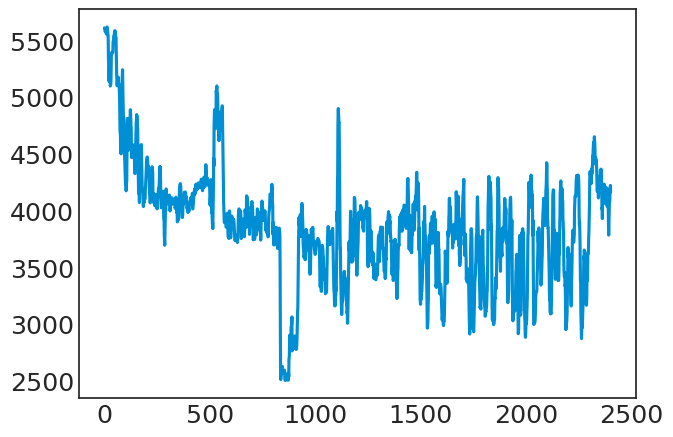

In [96]:
plt.plot(well2_DT_LR_stack )

In [97]:
column = ['Pred_VP']
Pred_VP = pd.DataFrame(well2_DT_LR_stack, columns=column)
Pred_VP

,Pred_VP
0,5609.76
1,5603.02
2,5593.13
3,5578.44
4,5578.44
...,...
2396,4084.87
2397,4130.20
2398,4178.42
2399,4222.19


In [98]:
True_VP

,True_VP
0,4730.99
1,4799.14
2,4922.56
3,5007.89
4,5074.69
...,...
2396,4623.74
2397,4567.03
2398,4594.88
2399,4665.96


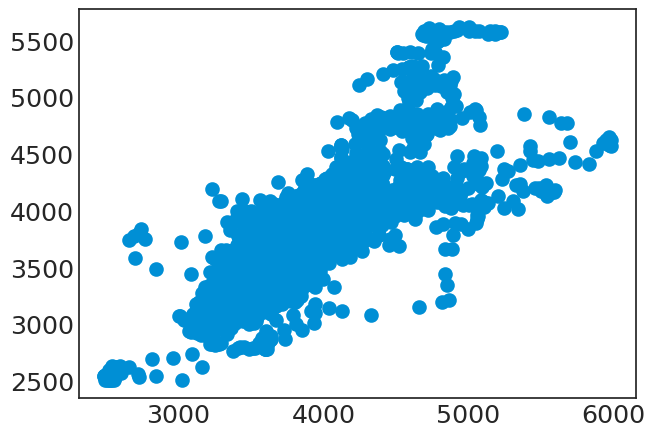

In [99]:
plt.scatter(True_VP,Pred_VP)

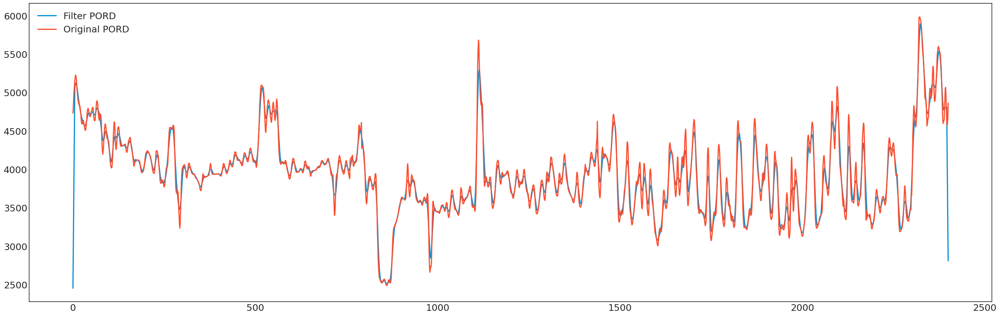

In [100]:
filter_length = 10
tair_moving_average_true_dt = np.convolve(True_VP['True_VP'], np.ones((filter_length)),mode = 'same')
tair_moving_average_true_dt /= filter_length
#tair_moving_average_2
plt.figure(figsize = (30,10))
plt.plot(tair_moving_average_true_dt , label= 'Filter PORD')
plt.plot(True_VP['True_VP'], label= 'Original PORD')
#plt.axis([0, 110, 0,0.4])
plt.legend()

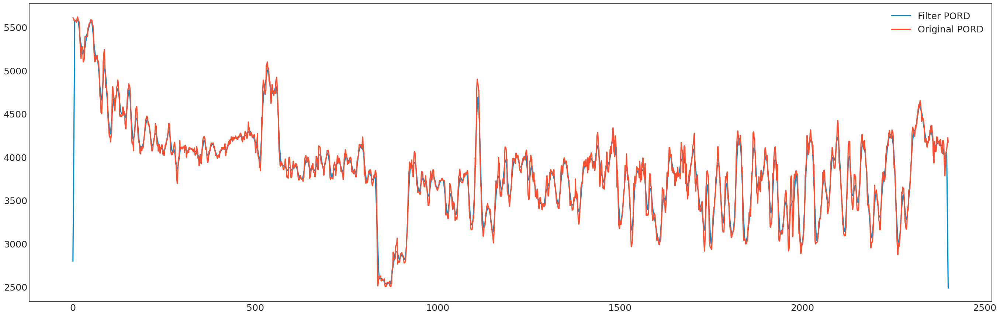

In [101]:
filter_length = 10
tair_moving_average_pred_dt = np.convolve(Pred_VP['Pred_VP'].values, np.ones((filter_length)),mode = 'same')
tair_moving_average_pred_dt /= filter_length
#tair_moving_average_2
plt.figure(figsize = (30,10))
plt.plot(tair_moving_average_pred_dt , label= 'Filter PORD')
plt.plot(Pred_VP['Pred_VP'].values, label= 'Original PORD')
#plt.axis([0, 110, 0,0.4])
plt.legend()

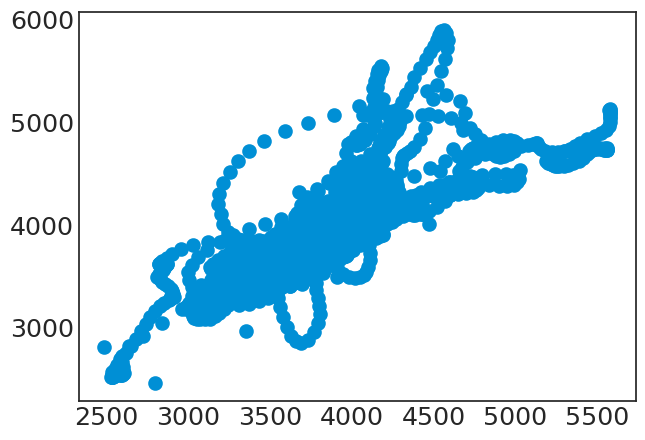

In [102]:
plt.scatter(tair_moving_average_pred_dt,tair_moving_average_true_dt)

In [103]:
column = ['Pred_VP_S']
columns = ['True_VP_S']
Pred_DT = pd.DataFrame(tair_moving_average_pred_dt, columns=column)
True_DT = pd.DataFrame(tair_moving_average_true_dt, columns=columns)

In [104]:
True_DT.describe()

,True_VP_S
count,2401.00
mean,3933.67
std,484.34
min,2453.53
25%,3614.27
50%,3917.11
75%,4139.75
max,5893.18


In [105]:
Pred_DT.describe()

,Pred_VP_S
count,2401.00
mean,3850.36
std,501.16
min,2485.82
25%,3543.87
50%,3858.32
75%,4097.18
max,5582.37


In [106]:
well_3_depth = well_3['DEPTH']

In [107]:
col = ['DEPTH']
well_2_depth = pd.DataFrame(well_3_depth,columns=col)
well_2_depth

,DEPTH
0,4200.00
1,4200.12
2,4200.25
3,4200.38
4,4200.50
...,...
2396,4499.50
2397,4499.62
2398,4499.75
2399,4499.88


In [108]:

Vp = 5.81 - (9.42 * well_3['NPHI']) - (2.21 * well_3['VSH']) #Vp (km/s)

Vp = Vp*1000   #km/s
print(Vp)

0      5065.75
1      5130.18
2      5216.06
3      5264.72
4      5287.00
         ...  
2396   3476.95
2397   3487.99
2398   3634.19
2399   3741.96
2400   3902.80
Length: 2401, dtype: float64


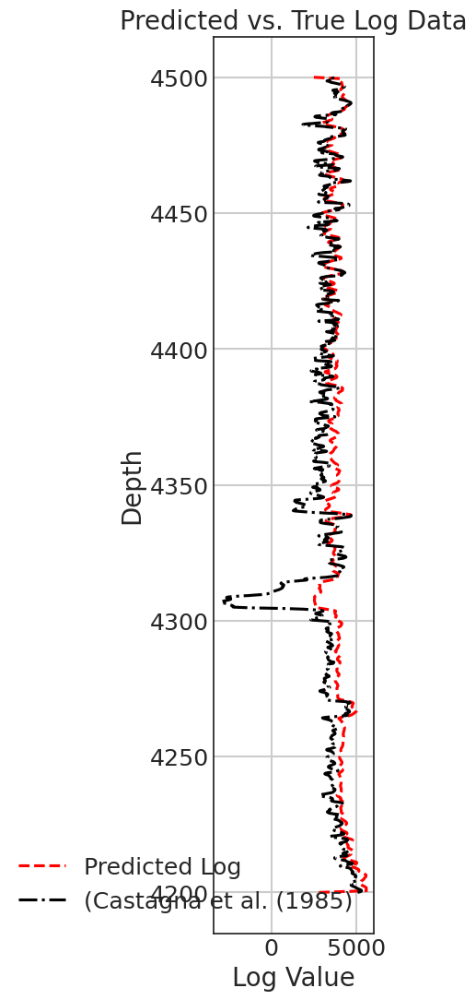

In [109]:
plt.figure(figsize=(2, 12))
#plt.plot(True_DT['True_VP_S'].values, DEPTH['DEPTH'], label='True Log', color='blue', linestyle='-')
plt.plot(Pred_DT['Pred_VP_S'].values, DEPTH['DEPTH'], label='Predicted Log', color='red', linestyle='--')
plt.plot(Vp, DEPTH['DEPTH'], label='(Castagna et al. (1985)', color='black', linestyle='dashdot')
# Add labels and legend
plt.xlabel('Log Value')
plt.ylabel('Depth')
plt.title('Predicted vs. True Log Data')
plt.legend()

# Customize appearance
plt.grid(True)
#plt.gca().invert_yaxis()  # Invert y-axis to show increasing depth downwards
#plt.xlim(0, 150)
# Show the plot
plt.show()

# prediction well_7

In [110]:
test_features = ['DEPTH','GR',	'RHOB',	'RT',	'VSH',	'NPHI']
#well_6.describe()
well_7 = well7[test_features]
well_7.dropna(inplace=True)
well_7.describe()

,DEPTH,GR,RHOB,RT,VSH,NPHI
count,2016.00,2016.00,2016.00,2016.00,2016.00,2016.00
mean,4435.45,50.29,2.47,4.00,0.37,0.18
std,58.21,26.72,0.13,15.86,0.27,0.06
min,4334.70,7.82,2.09,0.19,0.02,-0.00
25%,4385.08,28.21,2.36,0.52,0.14,0.15
50%,4435.45,42.48,2.48,1.43,0.26,0.17
75%,4485.82,73.55,2.55,2.11,0.66,0.21
max,4536.20,104.19,3.00,222.75,0.88,0.42


In [111]:
well_7 = well_7.loc[(well_7['DEPTH'] >= 4410) & (well_7['DEPTH'] <= 4510)]
well_7.reset_index(drop=True, inplace=True)

In [112]:
col = ['DEPTH']
DEPTH = pd.DataFrame(well_7['DEPTH'].values, columns=col)
well_7_test = well_7.drop(['DEPTH'], axis=1)
test_features = ['GR',	'RHOB',	'RT',	'VSH',	'NPHI']

In [113]:
well_7_test.describe()

,GR,RHOB,RT,VSH,NPHI
count,1001.00,1001.00,1001.00,1001.00,1001.00
mean,33.83,2.42,6.17,0.19,0.15
std,14.79,0.13,22.24,0.13,0.06
min,7.82,2.09,0.27,0.02,-0.00
25%,23.45,2.32,0.38,0.11,0.12
50%,33.30,2.39,0.62,0.17,0.16
75%,41.61,2.52,3.43,0.22,0.18
max,82.43,2.73,222.75,0.78,0.42


In [114]:
ct = ColumnTransformer([('transform', scaler, test_features)], remainder='passthrough')
well_test_norm7 = ct.fit_transform(well_7_test)  ## normalazation of well data

well_test_norm7 = pd.DataFrame(well_test_norm7, columns=test_features)  ## prediction
well_test_norm7

,GR,RHOB,RT,VSH,NPHI
0,0.04,-1.04,-0.99,-0.01,1.08
1,0.13,-1.06,-1.00,0.06,1.14
2,0.15,-1.09,-1.01,0.08,1.15
3,0.20,-1.11,-1.01,0.12,1.17
4,0.17,-1.13,-0.99,0.09,1.12
...,...,...,...,...,...
996,1.59,1.49,1.04,2.02,1.14
997,1.66,1.47,1.04,2.05,1.05
998,1.56,1.44,1.06,2.01,1.05
999,1.61,1.39,1.06,2.03,0.98


In [115]:
well7_DT_LR = LR_regressor.predict(well_test_norm7)
well7_DT_LR_rigid = gb_reg.predict(well_test_norm7)
well7_DT_SVM_lr = svm_regressor.predict(well_test_norm7)
well7_DT_SVM_rbf = svm_regressorrbf.predict(well_test_norm7)
well7_DT_LR_RF = modelRF.predict(well_test_norm7)
well7_DT_LR_GB = gb_reg.predict(well_test_norm7)
well7_DT_LR_stack = stacking_reg.predict(well_test_norm7)
well7_DT_LR_ANN = model_s.predict(well_test_norm7)
well7_DT_LR_ANNd = model.predict(well_test_norm7)

32/32 [==============================] - 0s 2ms/step


In [116]:
target = 'Vp'
y = well_train[target].values
scaler.fit(y.reshape(-1,1))

PowerTransformer()

In [117]:
well7_DT_LR  = scaler.inverse_transform(well7_DT_LR_RF.reshape(-1,1))
well7_DT_LR

array([[3506.54588914],
       [3354.91226054],
       [3289.12162333],
       ...,
       [3186.66210349],
       [3352.10469998],
       [3328.9768756 ]])

In [118]:
Vp = 5.81 - (9.42 * well_7['NPHI']) - (2.21 * well_7['VSH']) #Vp (km/s)
Vp = Vp*1000
Vp

0      3485.41
1      3441.68
2      3427.84
3      3409.58
4      3444.47
         ...  
996    2597.46
997    2615.83
998    2660.03
999    2675.61
1000   2661.77
Length: 1001, dtype: float64

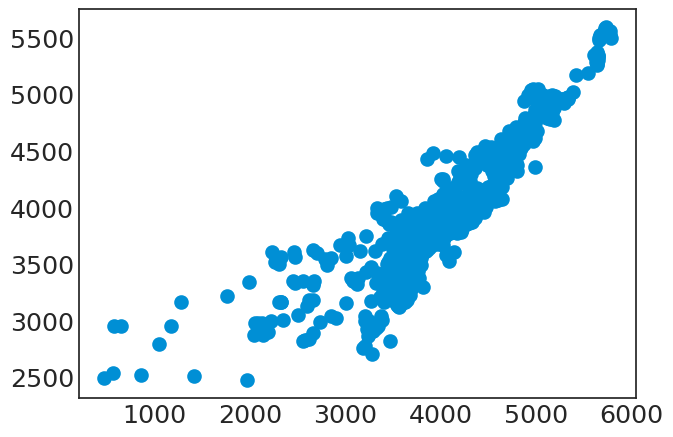

In [119]:
plt.scatter(Vp,well7_DT_LR)

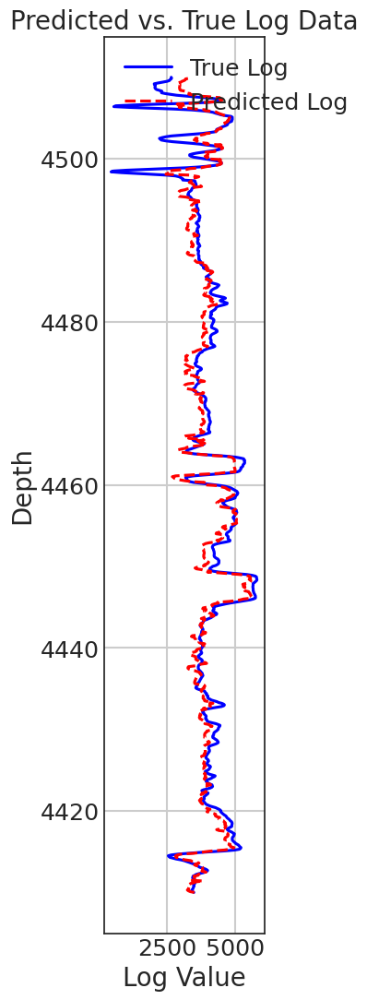

In [120]:
plt.figure(figsize=(2, 12))
plt.plot(Vp, well_7['DEPTH'], label='True Log', color='blue', linestyle='-')
plt.plot(well7_DT_LR, well_7['DEPTH'], label='Predicted Log', color='red', linestyle='--')
#plt.plot(VP, DEPTH['DEPTH'], label='(Castagna et al. (1985)', color='black', linestyle='dashdot')
# Add labels and legend
plt.xlabel('Log Value')
plt.ylabel('Depth')
plt.title('Predicted vs. True Log Data')
plt.legend()

# Customize appearance
plt.grid(True)
#plt.gca().invert_yaxis()  # Invert y-axis to show increasing depth downwards
#plt.xlim(0, 150)
# Show the plot
plt.show()

In [121]:
reg_metrics(y_test, y_pred_RF)

Mean Absolute Error: 0.15231279164835973
Mean Squared Error: 0.055181981066573606
Root Mean Squared Error: 0.23490845252262338
R Squared: 0.9456449604585844


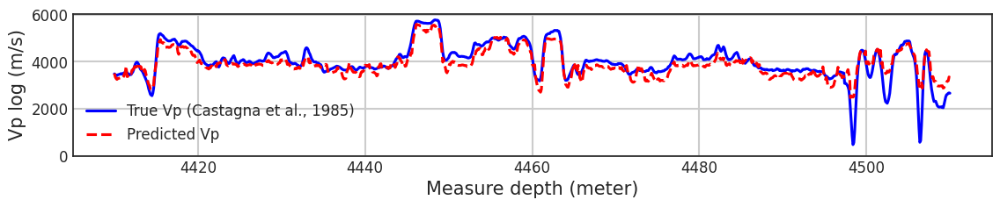

In [122]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 2))  # Adjust the figure size as needed

# Plot true Vp values
plt.plot(well_7['DEPTH'], Vp, label='True Vp (Castagna et al., 1985)', color='blue', linestyle='-')

# Plot predicted Vp values
plt.plot(well_7['DEPTH'], well7_DT_LR, label='Predicted Vp', color='red', linestyle='--')

plt.xlabel('Measure depth (meter)', fontsize=15)
plt.ylabel('Vp log (m/s)', fontsize=15)
#plt.title('Well_7 Vp', fontsize=20)

plt.yticks([0, 2000, 4000, 6000], fontsize=12)
plt.xticks(fontsize=12)

plt.grid(True)
plt.legend(fontsize=12)

# Show the plot
plt.show()

# clustering

In [123]:
well_train_svm.describe()

,GR,RHOB,RT,VSH,NPHI,Vp,VS
count,8541.00,8541.00,8541.00,8541.00,8541.00,8541.00,8541.00
mean,0.01,0.03,-0.05,0.02,-0.04,0.03,0.03
std,0.92,0.84,0.88,0.98,0.90,0.90,0.91
min,-2.09,-1.99,-1.89,-1.02,-2.06,-2.28,-2.06
25%,-0.71,-0.59,-0.55,-1.02,-0.69,-0.62,-0.82
50%,-0.04,0.17,-0.02,-0.20,-0.05,0.06,0.12
75%,0.77,0.72,0.57,1.03,0.63,0.62,0.82
max,2.12,1.85,2.25,1.52,2.41,2.17,2.08


In [124]:
X = well_train_svm.iloc[:, [0,1,2,3,4]].values

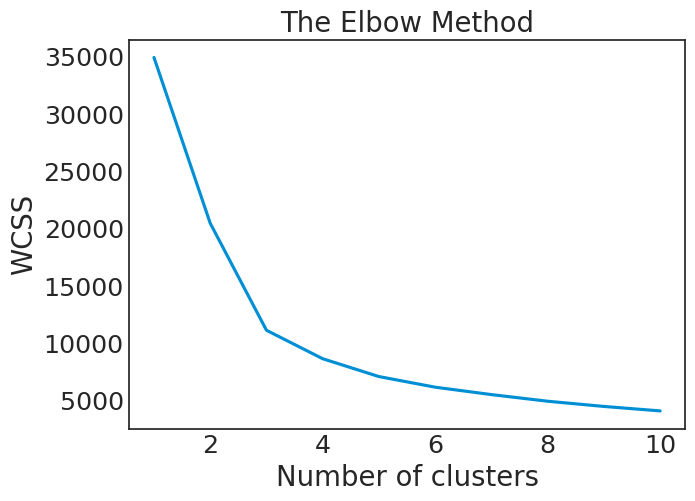

In [125]:
from sklearn.cluster import KMeans
import sklearn.cluster as cluster
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [126]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(X)

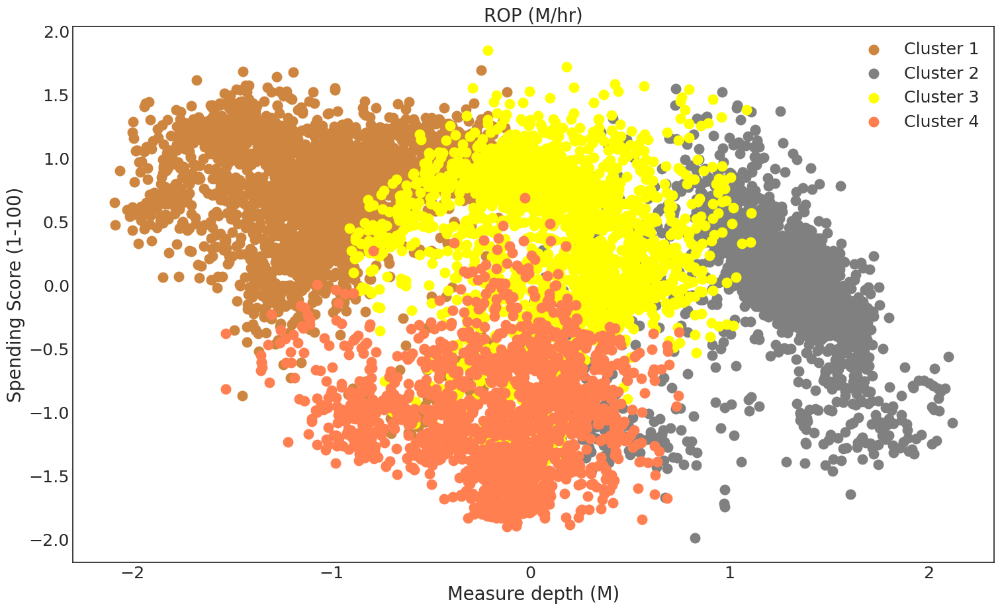

In [127]:
plt.figure(figsize=(16,10))

plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], s = 100, c = 'peru', label = 'Cluster 1')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s = 100, c = 'grey', label = 'Cluster 2')
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s = 100, c = 'yellow', label = 'Cluster 3')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s = 100, c = 'coral', label = 'Cluster 4')

#plt.scatter(X[y_kmeans == 4, 0], X[y_kmeans == 4, 1], s = 100, c = 'magenta', label = 'formation 5')
#plt.scatter(X[y_kmeans == 5, 0], X[y_kmeans == 5, 1], s = 100, c = 'black', label = 'formation 6')
#plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, c = 'yellow', label = 'Centroids')

plt.title('ROP (M/hr)')  #'yellow', 'grey', 'coral','peru'
plt.xlabel('Measure depth (M)')
plt.ylabel('Spending Score (1-100)')

plt.legend()
plt.show()

In [128]:
plt.rcParams.update({'font.size': 30})

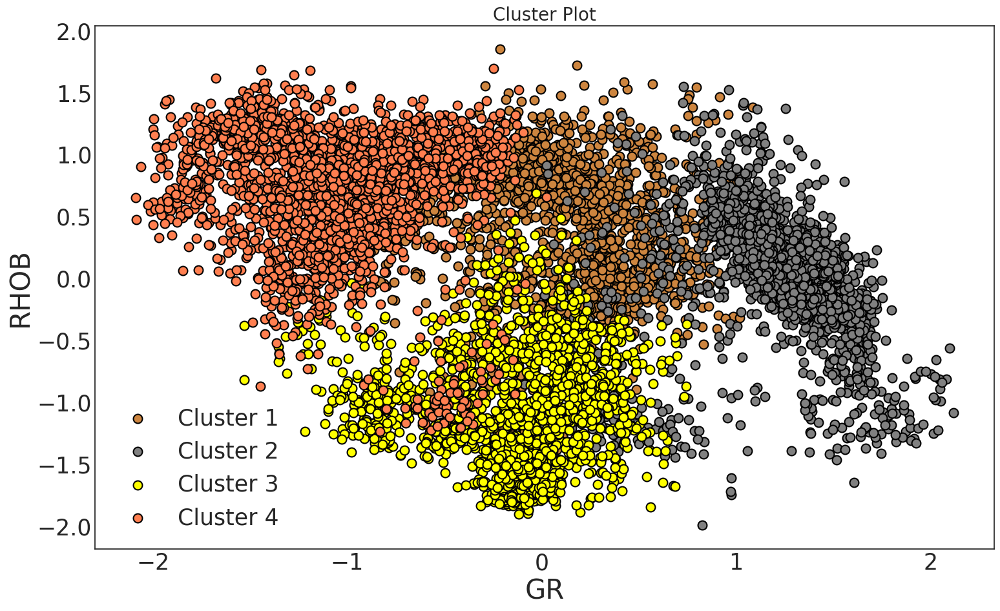

In [129]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 30})
plt.figure(figsize=(16, 10))

# Define features and cluster properties
feature_names = ['GR', 'RHOB', 'RT', 'VSH', 'NPHI']
clusters = [(0, 'peru', 'Cluster 1'),
            (1, 'grey', 'Cluster 2'),
            (2, 'yellow', 'Cluster 3'),
            (3, 'coral', 'Cluster 4'),
            ]

# Choose the features to plot
x_feature_index = 0  # Index of the feature for the x-axis
y_feature_index = 1  # Index of the feature for the y-axis

# Plot each cluster
for cluster_id, color, label in clusters:
    # Check if there are any data points for the current cluster ID
    if any(y_kmeans == cluster_id):
        plt.scatter(X[y_kmeans == cluster_id, x_feature_index],
                    X[y_kmeans == cluster_id, y_feature_index],
                    s=100, c=color, label=label, edgecolor='k')

# Add labels and legend
plt.xlabel(feature_names[x_feature_index], fontsize=30)
plt.ylabel(feature_names[y_feature_index], fontsize=30)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.legend(fontsize=25)
plt.title('Cluster Plot', fontsize=20)

# Show the plot
plt.show()


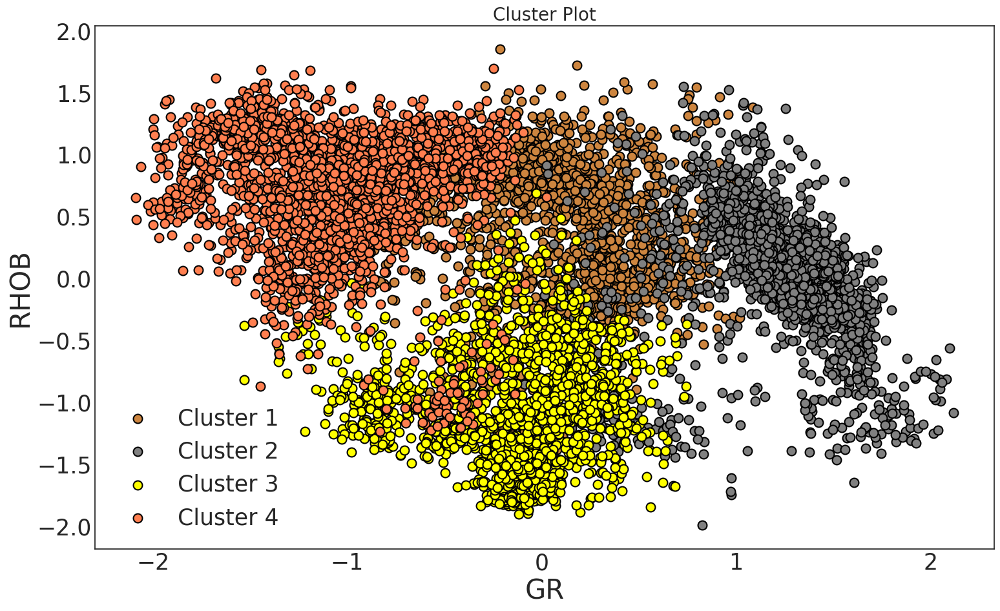

In [130]:

plt.figure(figsize=(16,10))

# Assuming X is your data array and y_kmeans is the cluster labels array
# X has shape (n_samples, n_features)
# feature_names is a list of the names of your features
feature_names = ['GR',	'RHOB',	'RT',	'VSH',	'NPHI']

# Define cluster properties: cluster_id, color, label
clusters = [
    (0, 'peru', 'Cluster 1'),
    (1, 'grey', 'Cluster 2'),
    (2, 'yellow', 'Cluster 3'),
    (3, 'coral', 'Cluster 4')]

# Choose the features to plot
x_feature_index = 0  # Index of the feature for the x-axis
y_feature_index = 1  # Index of the feature for the y-axis

# Plot each cluster
for cluster_id, color, label in clusters:
    plt.scatter(X[y_kmeans == cluster_id, x_feature_index],
                X[y_kmeans == cluster_id, y_feature_index],
                s=100, c=color, label=label, edgecolor='k')

# Add labels and legend
plt.xlabel(feature_names[x_feature_index], fontsize=30)
plt.ylabel(feature_names[y_feature_index], fontsize=30)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.legend(fontsize=25)
plt.title('Cluster Plot', fontsize=20)



# Show the plot
plt.show()


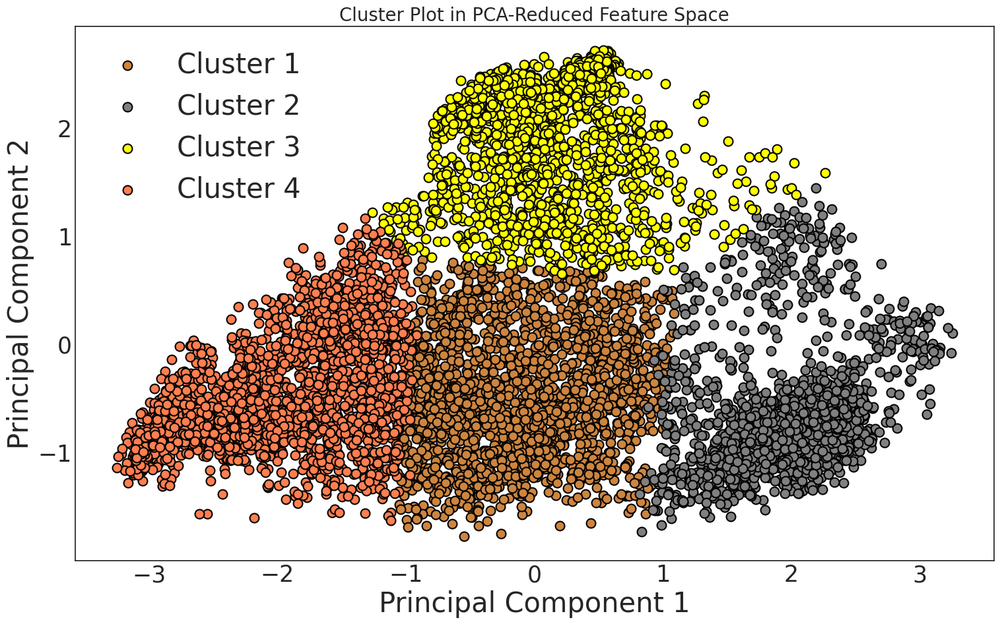

In [131]:
from sklearn.decomposition import PCA
plt.figure(figsize=(16,10))
# Assuming X is your data array and y_kmeans is the cluster labels array
# X has shape (n_samples, n_features)

# Define cluster properties: cluster_id, color, label
clusters = [
    (0, 'peru', 'Cluster 1'),
    (1, 'grey', 'Cluster 2'),
    (2, 'yellow', 'Cluster 3'),
    (3, 'coral', 'Cluster 4')
]

# Perform PCA to reduce the data to 2 dimensions
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Plot each cluster using the PCA-transformed data
for cluster_id, color, label in clusters:
    plt.scatter(X_pca[y_kmeans == cluster_id, 0],
                X_pca[y_kmeans == cluster_id, 1],
                s=100, c=color, label=label, edgecolor='k')

# Add labels and legend
plt.xlabel('Principal Component 1',fontsize=30)
plt.ylabel('Principal Component 2',fontsize=30)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.legend(fontsize=25)
plt.legend(fontsize=30)
plt.title('Cluster Plot in PCA-Reduced Feature Space')

# Show the plot
plt.show()


In [132]:
kmeans.cluster_centers_

array([[ 0.10715265,  0.28954305,  0.2191495 ,  0.21135176, -0.25072582],
       [ 1.17987674,  0.00413429, -0.06771294,  1.35636226,  1.04915721],
       [-0.16620021, -1.087446  , -1.31859014, -0.77332231,  0.15476917],
       [-1.04905677,  0.70207015,  0.70540767, -0.82191734, -1.05285522]])

In [133]:
well_train_svm['KMeans'] = kmeans.labels_
#well_train_svm['Cluster'] = y_kmeans
well_train_svm

,GR,RHOB,RT,VSH,NPHI,Vp,VS,KMeans
0,0.03,0.13,-0.05,0.28,-0.42,0.29,-0.35,0
1,0.03,0.18,-0.07,0.26,-0.24,0.25,-0.40,0
2,-0.16,0.22,-0.09,-0.23,-0.14,0.20,-0.43,0
3,-0.19,0.04,-0.11,-0.33,-0.15,0.16,-0.40,0
4,-0.29,0.03,-0.11,-0.61,-0.27,0.14,-0.34,0
...,...,...,...,...,...,...,...,...
10658,1.17,0.21,-0.47,1.29,0.45,0.24,-0.13,1
10662,1.23,0.91,-0.45,1.52,0.74,-0.50,-0.37,1
10673,1.18,0.63,-0.57,1.48,1.00,-0.07,-0.88,1
10674,1.16,0.52,-0.55,1.47,1.07,-0.05,-0.90,1


In [134]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=4)

# Fit the model to our dataset
gmm.fit(well_train_svm[['GR', 'RHOB', 'NPHI','RT','VSH']])

# Predict the labels
gmm_labels = gmm.predict(well_train_svm[['GR', 'RHOB', 'NPHI','RT','VSH']])

# Assign the labels back to the workingdf
well_train_svm['GMM'] = gmm_labels

In [135]:
well_train_svm

,GR,RHOB,RT,VSH,NPHI,Vp,VS,KMeans,GMM
0,0.03,0.13,-0.05,0.28,-0.42,0.29,-0.35,0,0
1,0.03,0.18,-0.07,0.26,-0.24,0.25,-0.40,0,0
2,-0.16,0.22,-0.09,-0.23,-0.14,0.20,-0.43,0,0
3,-0.19,0.04,-0.11,-0.33,-0.15,0.16,-0.40,0,0
4,-0.29,0.03,-0.11,-0.61,-0.27,0.14,-0.34,0,0
...,...,...,...,...,...,...,...,...,...
10658,1.17,0.21,-0.47,1.29,0.45,0.24,-0.13,1,1
10662,1.23,0.91,-0.45,1.52,0.74,-0.50,-0.37,1,1
10673,1.18,0.63,-0.57,1.48,1.00,-0.07,-0.88,1,1
10674,1.16,0.52,-0.55,1.47,1.07,-0.05,-0.90,1,1


In [136]:
well_train_svm.loc[:, 'WELL'] = ['159-19BT2'] * 8541

In [137]:
well_train_svm

,GR,RHOB,RT,VSH,NPHI,Vp,VS,KMeans,GMM,WELL
0,0.03,0.13,-0.05,0.28,-0.42,0.29,-0.35,0,0,159-19BT2
1,0.03,0.18,-0.07,0.26,-0.24,0.25,-0.40,0,0,159-19BT2
2,-0.16,0.22,-0.09,-0.23,-0.14,0.20,-0.43,0,0,159-19BT2
3,-0.19,0.04,-0.11,-0.33,-0.15,0.16,-0.40,0,0,159-19BT2
4,-0.29,0.03,-0.11,-0.61,-0.27,0.14,-0.34,0,0,159-19BT2
...,...,...,...,...,...,...,...,...,...,...
10658,1.17,0.21,-0.47,1.29,0.45,0.24,-0.13,1,1,159-19BT2
10662,1.23,0.91,-0.45,1.52,0.74,-0.50,-0.37,1,1,159-19BT2
10673,1.18,0.63,-0.57,1.48,1.00,-0.07,-0.88,1,1,159-19BT2
10674,1.16,0.52,-0.55,1.47,1.07,-0.05,-0.90,1,1,159-19BT2


In [138]:
well_train_svm['DEPTH'] = range(8541)

In [139]:
def create_plot(wellname, dataframe, curves_to_plot, depth_curve, log_curves=[], facies_curves=[]):
    # Count the number of tracks we need
    num_tracks = len(curves_to_plot)

    facies_color = ['yellow', 'grey', 'coral','peru','orange']


    # Setup the figure and axes
    fig, ax = plt.subplots(nrows=1, ncols=num_tracks, figsize=(num_tracks*2, 10))

    # Create a super title for the entire plot
    fig.suptitle(wellname, fontsize=20, y=1.05)

    # Loop through each curve in curves_to_plot and create a track with that data
    for i, curve in enumerate(curves_to_plot):
        if curve in facies_curves:
            num_colors = len(dataframe[curve].unique())
            cmap_facies = colors.ListedColormap(facies_color[:num_colors], 'indexed')

            cluster=np.repeat(np.expand_dims(dataframe[curve].values,1), 100, 1)
            im=ax[i].imshow(cluster, interpolation='none', cmap=cmap_facies, aspect='auto',vmin=dataframe[curve].min(),vmax=dataframe[curve].max(),
                            extent=[0,20, depth_curve.max(), depth_curve.min()])

#             for key in lithology_setup.keys():
#                 color = lithology_setup[key]['color']
#                 ax[i].fill_betweenx(depth_curve, 0, dataframe[curve].max(),
#                                   where=(dataframe[curve]==key),
#                                   facecolor=color)
#
        else:
            ax[i].plot(dataframe[curve], depth_curve)


        # Setup a few plot cosmetics
        ax[i].set_title(curve, fontsize=14, fontweight='bold')
        ax[i].grid(which='major', color='lightgrey', linestyle='-')

        # We want to pass in the deepest depth first, so we are displaying the data
        # from shallow to deep
        ax[i].set_ylim(depth_curve.max(), depth_curve.min())
#         ax[i].set_ylim(3500, 3000)

        # Only set the y-label for the first track. Hide it for the rest
        if i == 0:
            ax[i].set_ylabel('DEPTH (m)', fontsize=18, fontweight='bold')
        else:
            plt.setp(ax[i].get_yticklabels(), visible = False)

        # Check to see if we have any logarithmic scaled curves
        if curve in log_curves:
            ax[i].set_xscale('log')
            ax[i].grid(which='minor', color='lightgrey', linestyle='-')



    plt.tight_layout()
    plt.show()

    return cmap_facies

In [140]:
def well_splitter(dataframe, groupby_column):
    grouped = dataframe.groupby(groupby_column)

    # Create empty lists
    wells_as_dfs = []
    wells_wellnames = []

    #Split up the data by well
    for well, data in grouped:
        wells_as_dfs.append(data)
        wells_wellnames.append(well)

    print('index  wellname')
    for i, name in enumerate(wells_wellnames):
        print(f'{i}      {name}')

    return wells_as_dfs, wells_wellnames

In [141]:
dfs_wells, wellnames = well_splitter(well_train_svm, 'WELL')

index  wellname
0      159-19BT2


In [142]:
unique_items = well_train_svm['GMM'].unique()

# Loop through unique items and print their lengths
for item in unique_items:
    print(f"Length of '{item}': {len(well_train_svm[well_train_svm['GMM'] == item])}")

Length of '0': 2900
Length of '2': 2229
Length of '1': 1908
Length of '3': 1504


In [143]:
unique_items = well_train_svm['KMeans'].unique()

# Loop through unique items and print their lengths
for item in unique_items:
    print(f"Length of '{item}': {len(well_train_svm[well_train_svm['KMeans'] == item])}")

Length of '0': 2008
Length of '3': 2406
Length of '1': 2299
Length of '2': 1828


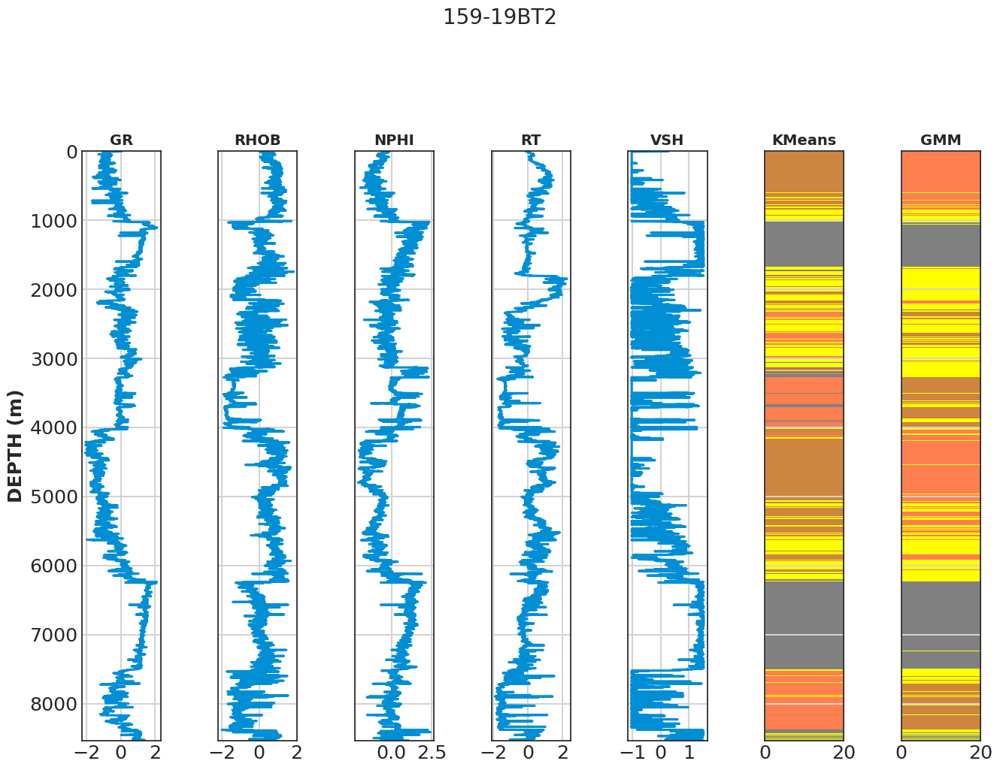

In [144]:
# Setup the curves to plot
curves_to_plot = ['GR', 'RHOB', 'NPHI','RT','VSH', 'KMeans','GMM']
logarithmic_curves = []
facies_curve=['KMeans','GMM']

# Create plot by passing in the relevant well index number
well = 0
cmap_facies = create_plot(wellnames[well],
            dfs_wells[well],
            curves_to_plot,
            dfs_wells[well]['DEPTH'],
            logarithmic_curves, facies_curve)

In [192]:
c = ['GR',	'RHOB',	'RT',	'VSH',	'NPHI'	]
X = well_train_svm[c]
y = well_train_svm['Vp']#

In [222]:
c = ['GR',	'RHOB',	'RT',	'VSH',	'NPHI'	]
X = well_train_[c]
y = well_train_['Vp']

In [223]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score, train_test_split

# Assuming X and y are your data features and target variables
# Replace these with your actual data
# X = ...
# y = ...

# Step 1: Unsupervised Clustering (K-Means)
k = 4  # Number of clusters
kmeans = KMeans(n_clusters=k, random_state=42)
cluster_labels = kmeans.fit_predict(X)

# Step 2: Split data into train and test sets
X_train, X_test, y_train, y_test, clusters_train, clusters_test = train_test_split(X, y, cluster_labels, test_size=0.3, random_state=42)

# Step 3: Train Ensemble of Models (Random Forests for each cluster)
models = []
for cluster_id in range(k):
    # Filter data points belonging to the current cluster
    cluster_X_train = X_train[clusters_train == cluster_id]
    cluster_y_train = y_train[clusters_train == cluster_id]

    # Train a separate Random Forest model for each cluster
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(cluster_X_train, cluster_y_train)
    models.append(rf_model)

# Step 4: Evaluate the ensemble of models on test data
y_pred_test = np.zeros_like(y_test)
for cluster_id, model in enumerate(models):
    # Filter test data points belonging to the current cluster
    cluster_X_test = X_test[clusters_test == cluster_id]

    if len(cluster_X_test) > 0:
        # Predict sonic log values for the current cluster
        cluster_y_pred_test = model.predict(cluster_X_test)
        y_pred_test[clusters_test == cluster_id] = cluster_y_pred_test

# Calculate evaluation metrics for test data
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)

# Step 5: Evaluate the ensemble of models on training data
y_pred_train = np.zeros_like(y_train)
for cluster_id, model in enumerate(models):
    # Filter training data points belonging to the current cluster
    cluster_X_train = X_train[clusters_train == cluster_id]

    if len(cluster_X_train) > 0:
        # Predict sonic log values for the current cluster
        cluster_y_pred_train = model.predict(cluster_X_train)
        y_pred_train[clusters_train == cluster_id] = cluster_y_pred_train

# Calculate evaluation metrics for training data
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)
mae_train = mean_absolute_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)

# Perform cross-validation for each cluster and compute evaluation metrics
cv_results = {}
for cluster_id, model in enumerate(models):
    # Filter data points belonging to the current cluster
    cluster_X_train = X_train[clusters_train == cluster_id]
    cluster_y_train = y_train[clusters_train == cluster_id]

    # Perform cross-validation
    cv_scores = cross_val_score(model, cluster_X_train, cluster_y_train, cv=5, scoring='neg_mean_squared_error')

    # Extract cross-validation results
    cv_mse = -cv_scores.mean()
    cv_r2 = cross_val_score(model, cluster_X_train, cluster_y_train, cv=5, scoring='r2').mean()
    cv_mae = -cross_val_score(model, cluster_X_train, cluster_y_train, cv=5, scoring='neg_mean_absolute_error').mean()
    cv_rmse = np.sqrt(cv_mse)

    # Store cross-validation results for the current cluster
    cv_results[f'Cluster {cluster_id+1}'] = {'CV R^2': cv_r2, 'CV MSE': cv_mse, 'CV MAE': cv_mae, 'CV RMSE': cv_rmse}

# Print evaluation metrics for test data
print("Test Data Evaluation Metrics:")
print(f"Mean Squared Error: {mse_test:.2f}")
print(f"R^2: {r2_test:.2f}")
print(f"Mean Absolute Error: {mae_test:.2f}")
print(f"Root Mean Squared Error: {rmse_test:.2f}")

# Print evaluation metrics for training data
print("\nTraining Data Evaluation Metrics:")
print(f"Mean Squared Error: {mse_train:.2f}")
print(f"R^2: {r2_train:.2f}")
print(f"Mean Absolute Error: {mae_train:.2f}")
print(f"Root Mean Squared Error: {rmse_train:.2f}")

# Print cross-validation results
print("\nCross-Validation Results:")
for cluster, results in cv_results.items():
    print(cluster)
    for metric, value in results.items():
        print(f"{metric}: {value:.2f}")
    print()


Test Data Evaluation Metrics:
Mean Squared Error: 0.06
R^2: 0.94
Mean Absolute Error: 0.15
Root Mean Squared Error: 0.24

Training Data Evaluation Metrics:
Mean Squared Error: 0.01
R^2: 0.99
Mean Absolute Error: 0.06
Root Mean Squared Error: 0.09

Cross-Validation Results:
Cluster 1
CV R^2: 0.90
CV MSE: 0.05
CV MAE: 0.15
CV RMSE: 0.22

Cluster 2
CV R^2: 0.47
CV MSE: 0.10
CV MAE: 0.22
CV RMSE: 0.31

Cluster 3
CV R^2: 0.87
CV MSE: 0.05
CV MAE: 0.14
CV RMSE: 0.22

Cluster 4
CV R^2: 0.88
CV MSE: 0.05
CV MAE: 0.13
CV RMSE: 0.22



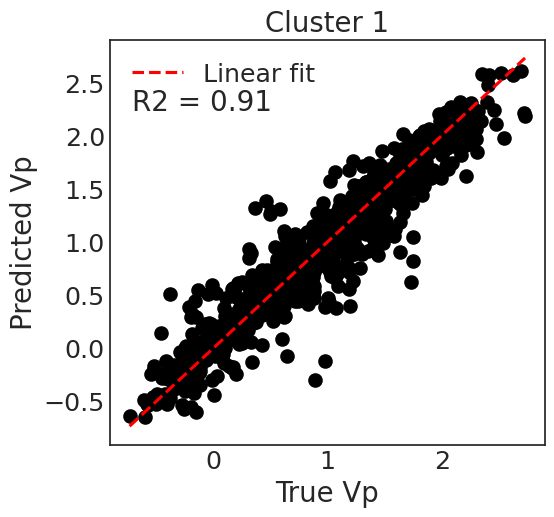

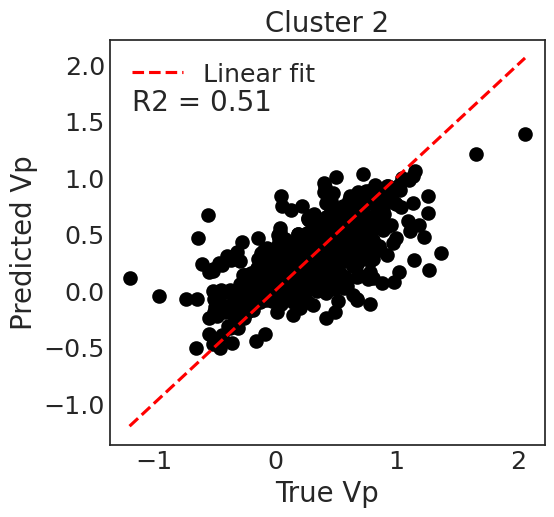

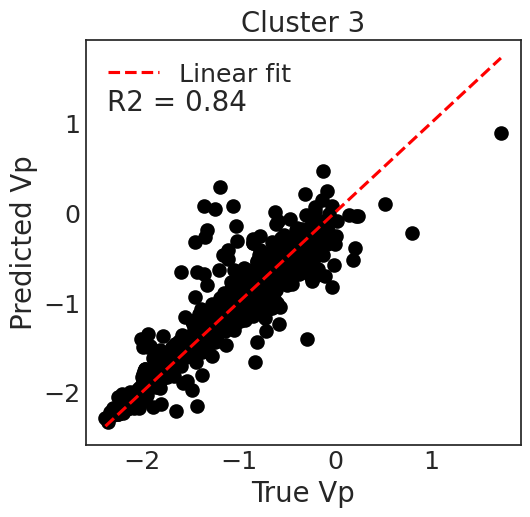

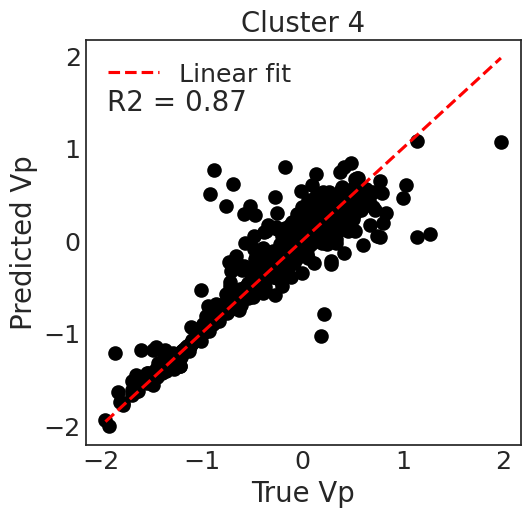

In [196]:
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
plt.rcParams.update({'font.size': 26})
# Plot results for each cluster
for cluster_id, model in enumerate(models):
    # Filter test data points belonging to the current cluster
    cluster_X_test = X_test[clusters_test == cluster_id]
    cluster_y_test = y_test[clusters_test == cluster_id]

    if len(cluster_X_test) > 0:
        # Predict sonic log values for the current cluster
        cluster_y_pred = model.predict(cluster_X_test)

        # Calculate R-squared value
        r2 = r2_score(cluster_y_test, cluster_y_pred)

        # Plot actual vs predicted values for the current cluster
        plt.figure(figsize=(5,5))
        plt.scatter(cluster_y_test, cluster_y_pred, color='black') # label='True vs Predicted'
        plt.plot([min(cluster_y_test), max(cluster_y_test)], [min(cluster_y_test), max(cluster_y_test)], color='red', linestyle='--', label='Linear fit')
        plt.text(0.05, 0.88, f'R2 = {r2:.2f}', transform=plt.gca().transAxes, fontsize=20, verticalalignment='top',horizontalalignment='left')  # Annotation for R-squared
        plt.title(f'Cluster {cluster_id+1}')
        plt.xlabel('True Vp')
        plt.ylabel('Predicted Vp')
        plt.legend()
        #plt.grid(True)
        plt.show()



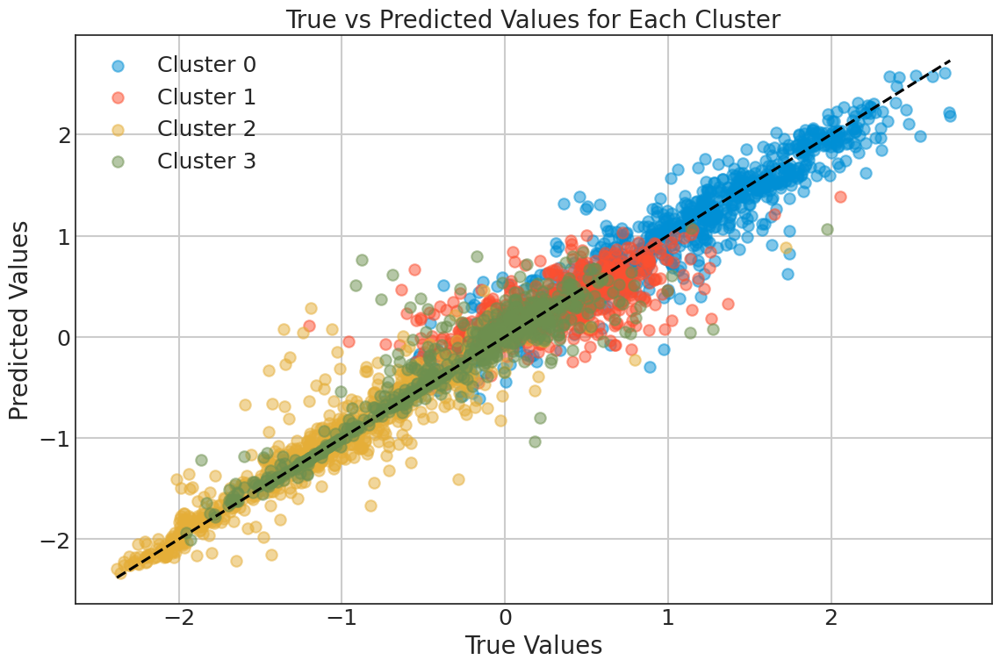

In [197]:
import matplotlib.pyplot as plt

# Plotting the true values vs predicted values for each cluster
plt.figure(figsize=(12, 8))
for cluster_id, model in enumerate(models):
    # Filter test data points belonging to the current cluster
    cluster_X_test = X_test[clusters_test == cluster_id]
    cluster_y_test = y_test[clusters_test == cluster_id]

    # Predict sonic log values for the current cluster
    cluster_y_pred = model.predict(cluster_X_test)

    # Plot true vs predicted values
    plt.scatter(cluster_y_test, cluster_y_pred, label=f'Cluster {cluster_id}', alpha=0.5)

# Plotting the diagonal line representing perfect predictions
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--')

# Adding labels and title
plt.title('True vs Predicted Values for Each Cluster')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.grid(True)
plt.show()


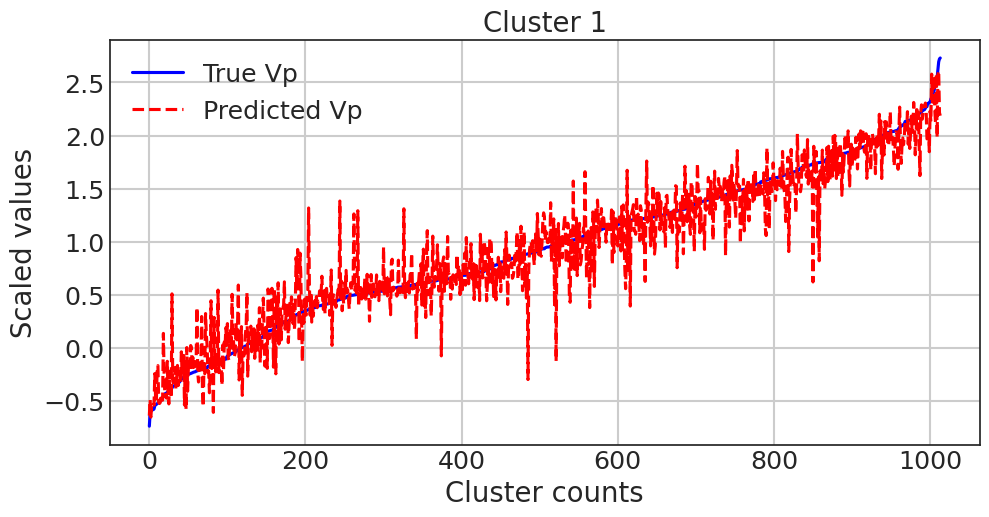

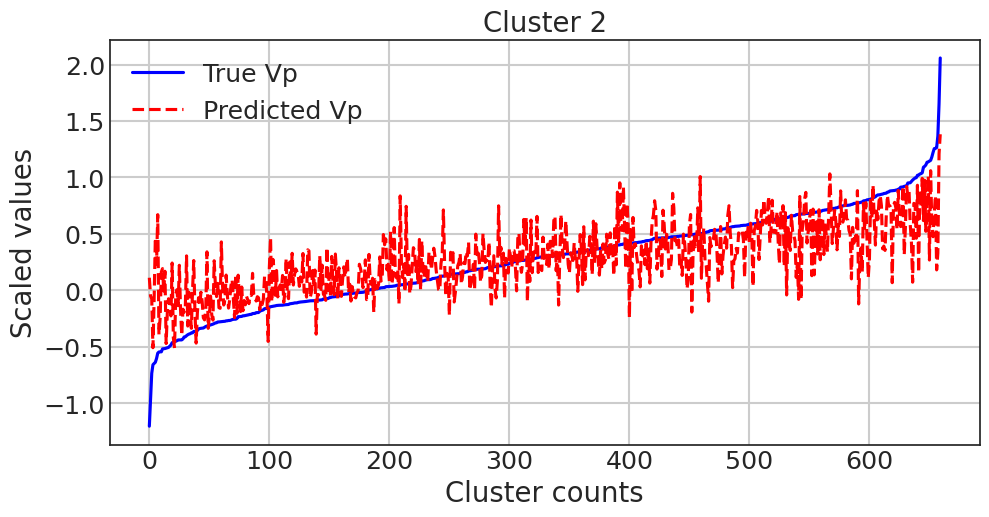

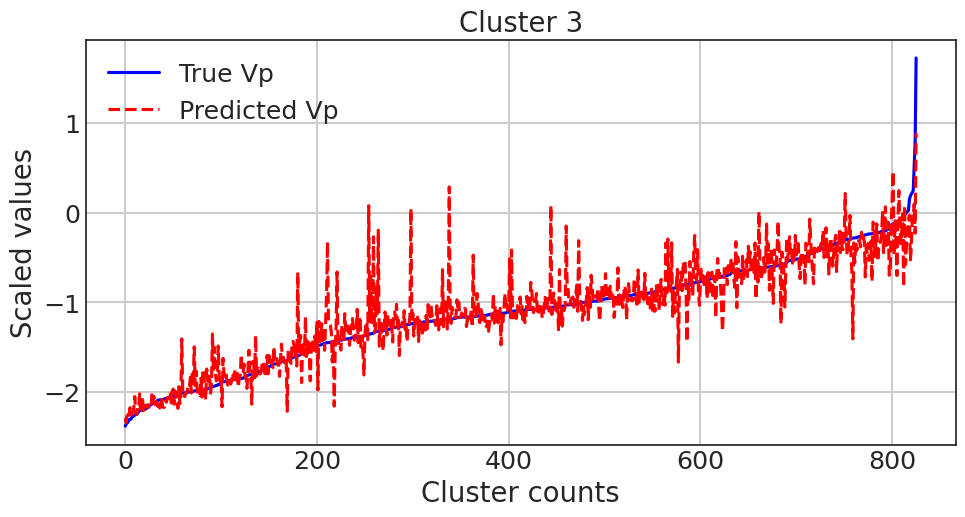

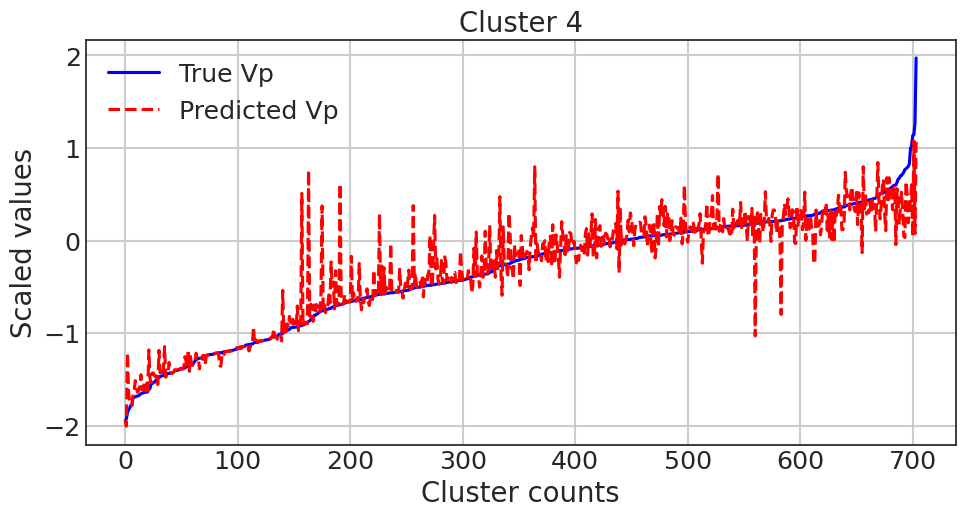

In [198]:
import matplotlib.pyplot as plt

# Plotting predicted vs true values for each cluster
for cluster_id, model in enumerate(models):
    # Filter test data points and corresponding predictions belonging to the current cluster
    cluster_X_test = X_test[clusters_test == cluster_id]
    cluster_y_test = y_test[clusters_test == cluster_id]
    cluster_y_pred = y_pred[clusters_test == cluster_id]

    # Sort the test data points by true values for plotting
    sorted_indices = np.argsort(cluster_y_test)
    cluster_X_test_sorted = cluster_X_test.iloc[sorted_indices]
    cluster_y_test_sorted = cluster_y_test.iloc[sorted_indices]
    cluster_y_pred_sorted = cluster_y_pred[sorted_indices]

    # Create line plot
    plt.figure(figsize=(10, 5))
    plt.plot(range(len(cluster_y_test_sorted)), cluster_y_test_sorted, 'b-', label='True Vp')
    plt.plot(range(len(cluster_y_pred_sorted)), cluster_y_pred_sorted, 'r--', label='Predicted Vp')
    plt.xlabel('Cluster counts')
    plt.ylabel('Scaled values')
    plt.title(f'Cluster {cluster_id + 1}')
    plt.legend()
    plt.grid(True)
    plt.show()


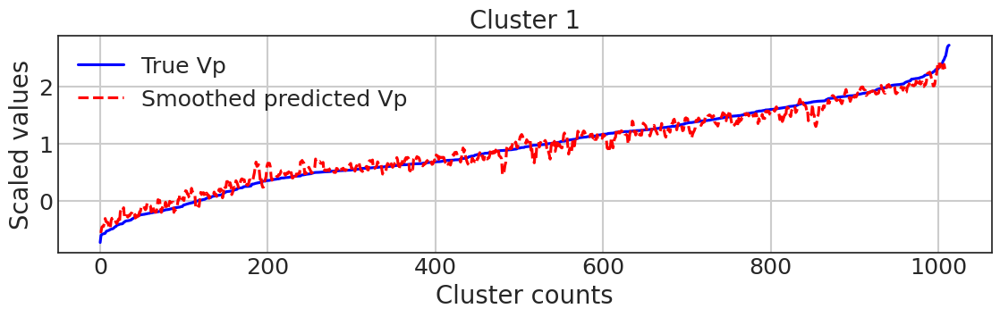

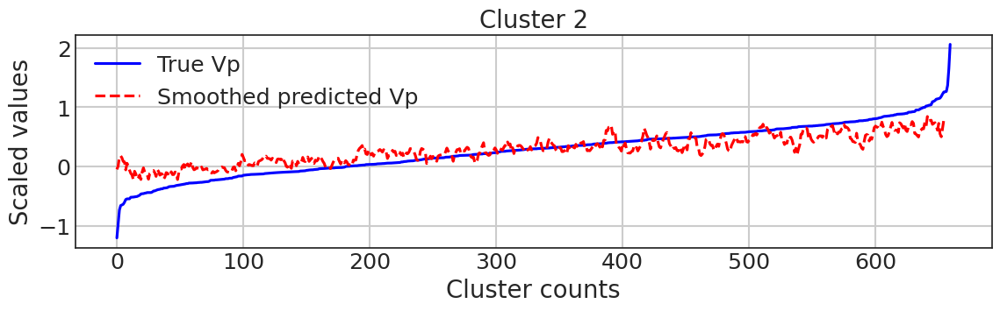

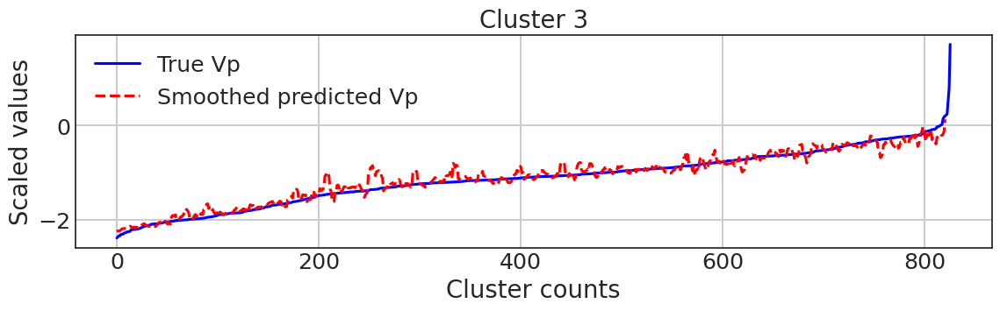

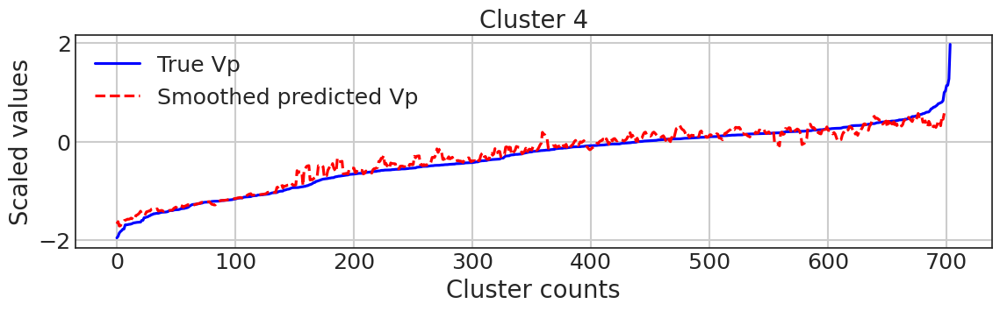

In [199]:
import numpy as np
import matplotlib.pyplot as plt

# Define moving average function
def moving_average(data, window_size):
    """Calculate the moving average of a given data array."""
    cumsum = np.cumsum(data)
    return (cumsum[window_size:] - cumsum[:-window_size]) / window_size

# Plotting predicted vs true values for each cluster
for cluster_id, model in enumerate(models):
    # Filter test data points and corresponding predictions belonging to the current cluster
    cluster_X_test = X_test[clusters_test == cluster_id]
    cluster_y_test = y_test[clusters_test == cluster_id]
    cluster_y_pred = y_pred[clusters_test == cluster_id]

    # Sort the test data points by true values for plotting
    sorted_indices = np.argsort(cluster_y_test)
    cluster_X_test_sorted = cluster_X_test.iloc[sorted_indices]
    cluster_y_test_sorted = cluster_y_test.iloc[sorted_indices]
    cluster_y_pred_sorted = cluster_y_pred[sorted_indices]

    # Apply moving average to predicted values
    smoothed_y_pred = moving_average(cluster_y_pred_sorted, window_size=5)  # Adjust window size as needed

    # Create line plot
    plt.figure(figsize=(12, 3))
    plt.plot(range(len(cluster_y_test_sorted)), cluster_y_test_sorted, 'b-', label='True Vp')
    plt.plot(range(len(smoothed_y_pred)), smoothed_y_pred, 'r--', label='Smoothed predicted Vp')
    plt.xlabel('Cluster counts')
    plt.ylabel('Scaled values')
    plt.title(f'Cluster {cluster_id + 1}')
    plt.legend()
    plt.grid(True)
    plt.show()


In [200]:
# Calculate R-squared (R2) and error metrics for each cluster test data
cluster_metrics = {}
for cluster_id, model in enumerate(models):
    cluster_X_test = X_test[clusters_test == cluster_id]
    cluster_y_test = y_test[clusters_test == cluster_id]
    cluster_y_pred = model.predict(cluster_X_test)

    # Calculate metrics for the current cluster
    cluster_mse = mean_squared_error(cluster_y_test, cluster_y_pred)
    cluster_r2 = r2_score(cluster_y_test, cluster_y_pred)
    cluster_mae = mean_absolute_error(cluster_y_test, cluster_y_pred)
    cluster_rmse = np.sqrt(cluster_mse)

    # Store metrics for the current cluster
    cluster_metrics[f'Cluster {cluster_id+1}'] = {'R2': cluster_r2, 'MSE': cluster_mse, 'MAE': cluster_mae, 'RMSE': cluster_rmse}

# Calculate overall model performance
overall_r2 = r2_score(y_test, y_pred)
overall_mse = mean_squared_error(y_test, y_pred)
overall_mae = mean_absolute_error(y_test, y_pred)
overall_rmse = np.sqrt(overall_mse)

# Print cluster-wise metrics
print("Cluster-wise Metrics:")
for cluster, metrics in cluster_metrics.items():
    print(cluster)
    for metric, value in metrics.items():
        print(f"{metric}: {value:.4f}")
    print()

# Print overall model performance
print("Overall Model Performance:")
print(f"Overall R^2: {overall_r2:.2f}")
print(f"Overall Mean Squared Error: {overall_mse:.2f}")
print(f"Overall Mean Absolute Error: {overall_mae:.2f}")
print(f"Overall Root Mean Squared Error: {overall_rmse:.2f}")


Cluster-wise Metrics:
Cluster 1
R2: 0.9083
MSE: 0.0470
MAE: 0.1506
RMSE: 0.2168

Cluster 2
R2: 0.5083
MSE: 0.0845
MAE: 0.2128
RMSE: 0.2908

Cluster 3
R2: 0.8396
MSE: 0.0528
MAE: 0.1401
RMSE: 0.2298

Cluster 4
R2: 0.8734
MSE: 0.0501
MAE: 0.1211
RMSE: 0.2237

Overall Model Performance:
Overall R^2: 0.94
Overall Mean Squared Error: 0.06
Overall Mean Absolute Error: 0.15
Overall Root Mean Squared Error: 0.24


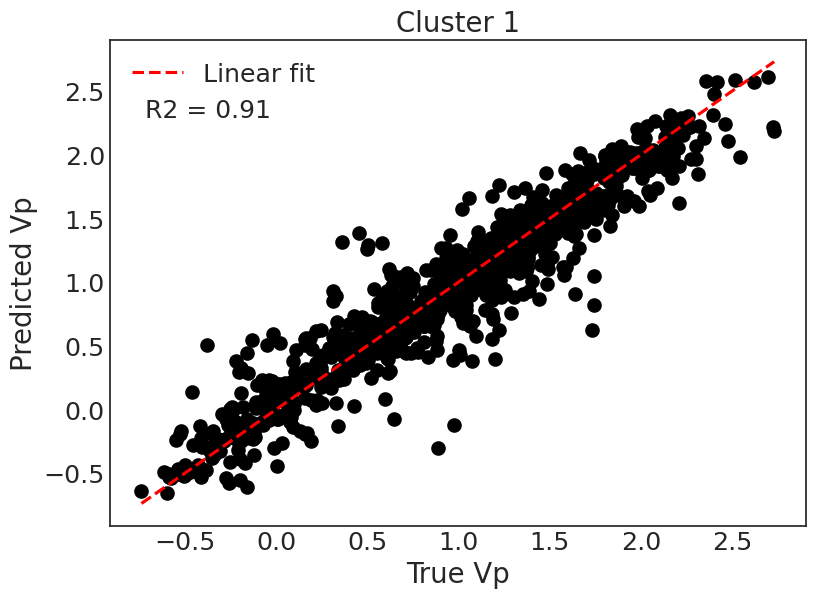

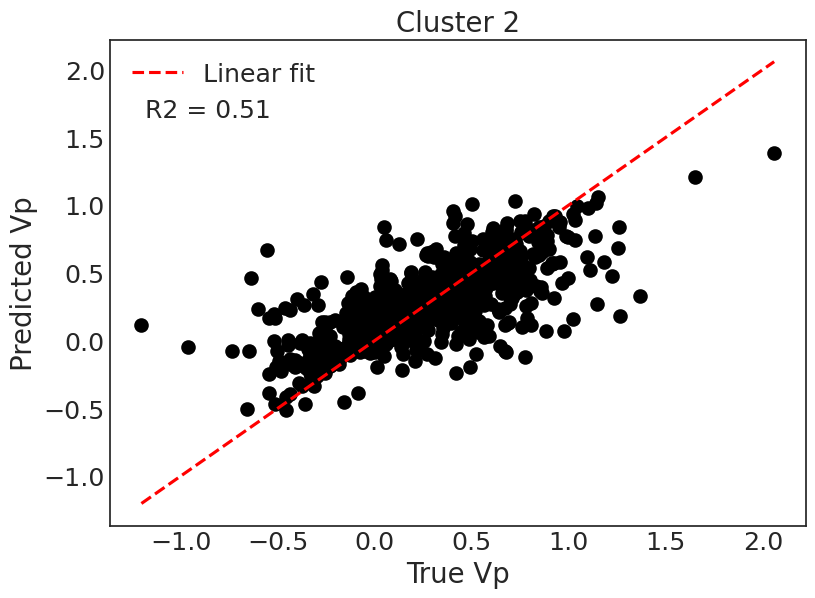

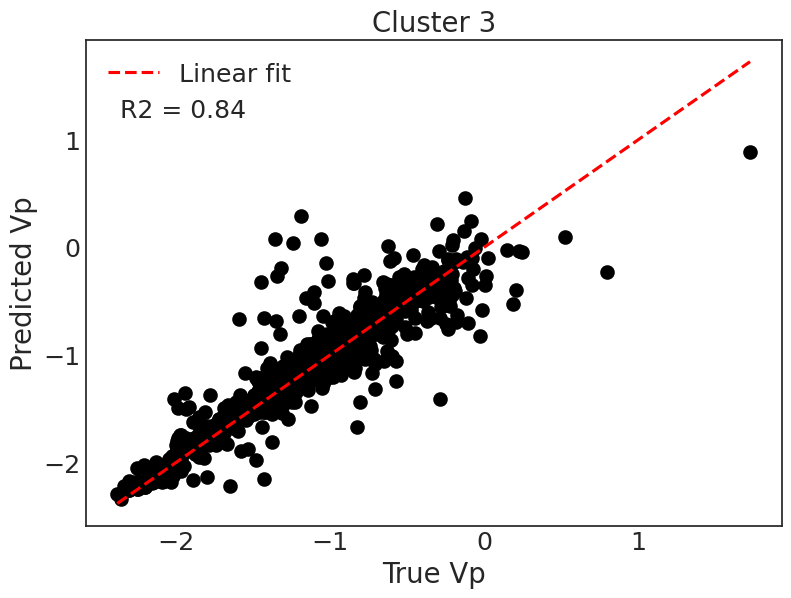

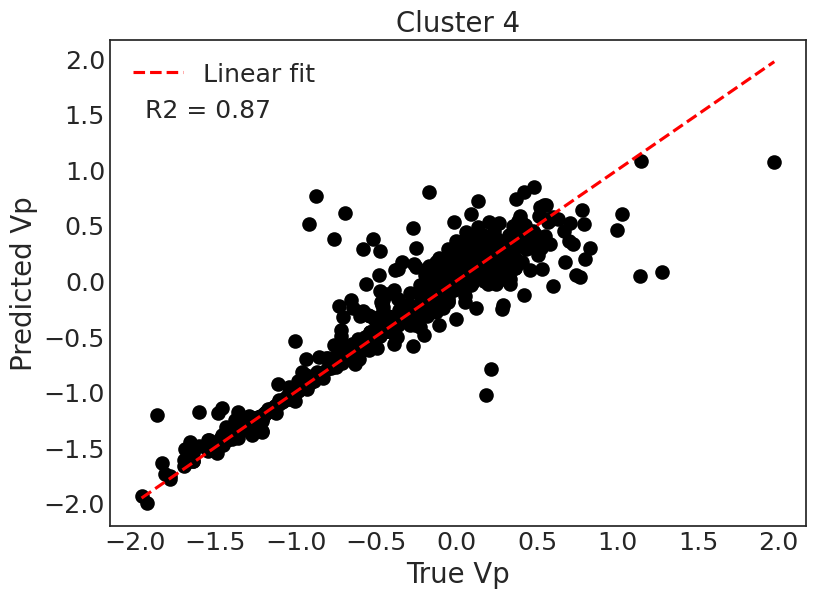

In [201]:
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
plt.rcParams.update({'font.size': 26})
# Plot results for each cluster
for cluster_id, model in enumerate(models):
    # Filter test data points belonging to the current cluster
    cluster_X_test = X_test[clusters_test == cluster_id]
    cluster_y_test = y_test[clusters_test == cluster_id]

    if len(cluster_X_test) > 0:
        # Predict sonic log values for the current cluster
        cluster_y_pred = model.predict(cluster_X_test)

        # Calculate R-squared value
        r2 = r2_score(cluster_y_test, cluster_y_pred)

        # Plot actual vs predicted values for the current cluster
        plt.figure(figsize=(8, 6))
        plt.scatter(cluster_y_test, cluster_y_pred, color='black') # label='True vs Predicted'
        plt.plot([min(cluster_y_test), max(cluster_y_test)], [min(cluster_y_test), max(cluster_y_test)], color='red', linestyle='--', label='Linear fit')
        plt.text(0.05, 0.88, f'R2 = {r2:.2f}', transform=plt.gca().transAxes, fontsize=18, verticalalignment='top',horizontalalignment='left')  # Annotation for R-squared
        plt.title(f'Cluster {cluster_id+1}')
        plt.xlabel('True Vp')
        plt.ylabel('Predicted Vp')
        plt.legend()
        #plt.grid(True)
        plt.show()



# # model test on test data

In [202]:
X_test

,GR,RHOB,RT,VSH,NPHI
5515,-2.07,1.41,1.49,-1.02,-2.25
1208,2.02,-1.61,0.25,1.52,2.07
10194,-0.00,-0.80,-1.40,-0.62,-0.10
2085,0.45,0.68,-0.36,1.23,0.45
2458,-0.10,-0.62,1.83,-0.30,-0.06
...,...,...,...,...,...
4480,-0.17,-1.37,-1.16,-1.02,0.04
6182,-1.74,1.40,1.67,-1.02,-2.16
749,-0.62,1.22,0.68,-1.02,-0.89
9317,-0.08,1.76,-0.92,-1.02,0.37


In [203]:
colms = ['GR','RHOB',	'RT',	'VSH','NPHI']
well_test = X_test[colms].values

In [204]:
# Assign cluster labels to test data points
cluster_labels_test = kmeans.predict(well_test)

# Initialize array to store predicted target values
y_pred_test = np.zeros(len(well_test))

# Predict target values for each test data point using the corresponding cluster-specific model
for i, x_test in enumerate(well_test):
    cluster_id = cluster_labels_test[i]  # Get the cluster label for the current test data point
    model = models[cluster_id]           # Get the corresponding cluster-specific model
    y_pred_test[i] = model.predict([x_test])  # Predict target value for the current test data point

In [205]:
y_pred_test

array([ 2.26776704, -2.22161572,  0.18816145, ...,  0.72942888,
        0.24910018, -0.2187736 ])

In [206]:
target = 'Vp'
y = well_train[target].values
scaler.fit(y.reshape(-1,1))

PowerTransformer()

In [207]:
well_test  = scaler.inverse_transform(y_pred_test.reshape(-1,1))
well_test

array([[5338.18859511],
       [2401.77234162],
       [3905.46360117],
       ...,
       [4267.29531514],
       [3945.79095244],
       [3638.90112795]])

In [208]:
well_test.size

3204

In [209]:
y_test

5515     2.08
1208    -2.34
10194    0.10
2085     0.21
2458     0.22
         ... 
4480    -0.49
6182     2.03
749      0.77
9317     0.15
2373    -0.24
Name: Vp, Length: 3204, dtype: float64

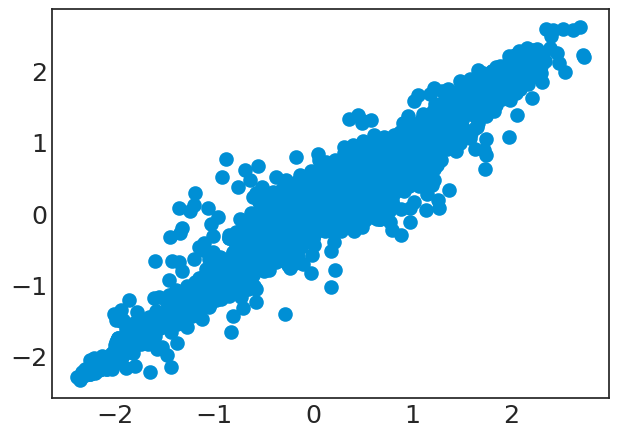

In [210]:
plt.scatter(y_test,y_pred_test)

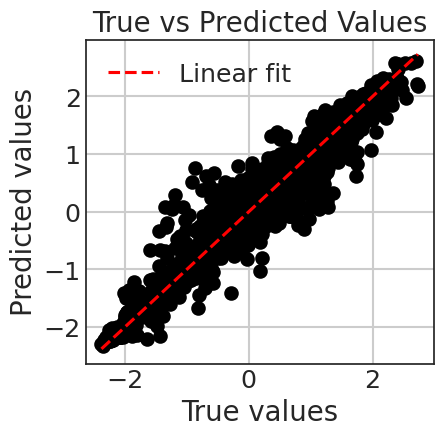

In [211]:
plt.figure(figsize=(4,4))
plt.scatter(y_test, y_pred_test, color='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Linear fit')
plt.title('True vs Predicted Values')
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.legend()
plt.grid(True)
plt.show()

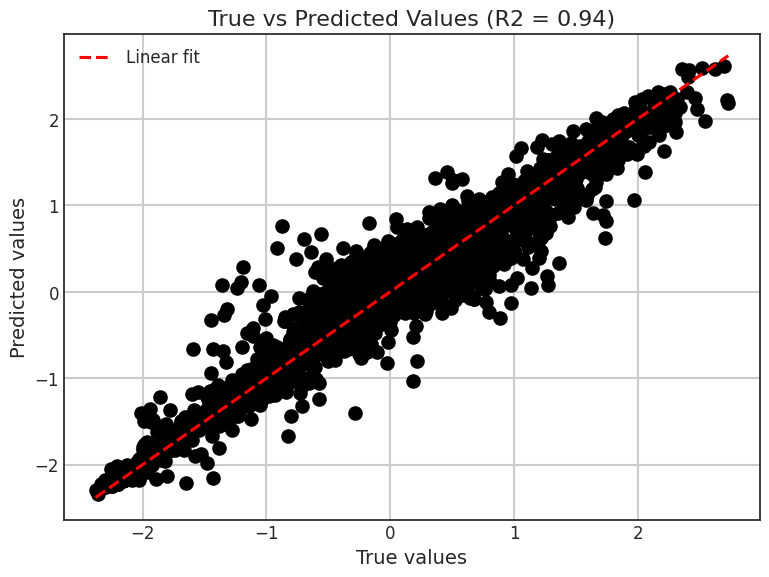

In [212]:
from sklearn.metrics import r2_score

# Calculate R-squared
r2 = r2_score(y_test, y_pred_test)

plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_test, color='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Linear fit')
plt.title(f'True vs Predicted Values (R2 = {r2:.2f})', fontsize=16)  # Include R2 in the title
plt.xlabel('True values', fontsize=14)
plt.ylabel('Predicted values', fontsize=14)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.show()

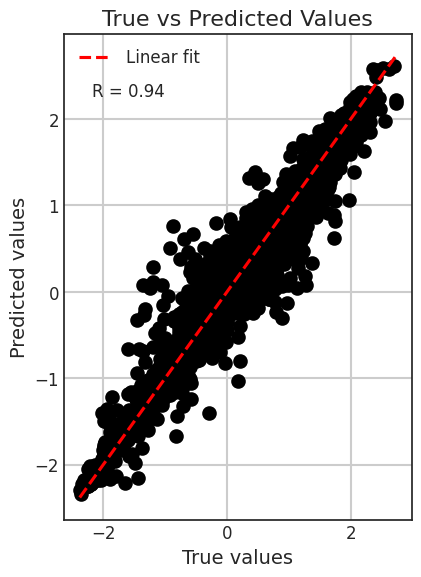

In [213]:
from sklearn.metrics import r2_score
plt.rcParams.update({'font.size': 24})
# Calculate R-squared
r2 = r2_score(y_test, y_pred_test)

plt.figure(figsize=(4,6))
plt.scatter(y_test, y_pred_test, color='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Linear fit')
plt.title('True vs Predicted Values', fontsize=16)
plt.xlabel('True values', fontsize=14)
plt.ylabel('Predicted values', fontsize=14)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)

# Annotate R-squared near the linear fit line (top left)
plt.text(0.08, 0.9, f'R = {r2:.2f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top',horizontalalignment='left')  # Annotation for R-squared

plt.show()


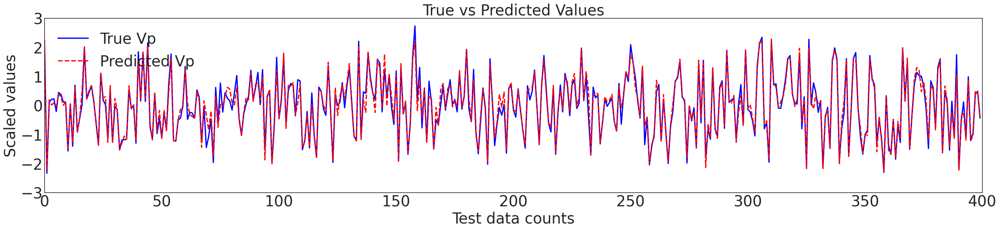

In [214]:
import matplotlib.pyplot as plt

# Create the figure and plot
plt.figure(figsize=(30, 6))
plt.plot(range(400), y_test[:400], 'b-', label='True Vp',linewidth=2.5)
plt.plot(range(400), y_pred_test[:400], 'r--', label='Predicted Vp',linewidth=2.5)
plt.xlabel('Test data counts', fontsize=30)
plt.ylabel('Scaled values', fontsize=30)
plt.title('True vs Predicted Values', fontsize=30)
plt.ylim(-3, 3)
plt.xlim(0, 400)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.legend(fontsize=30)

# Show the plot
plt.show()


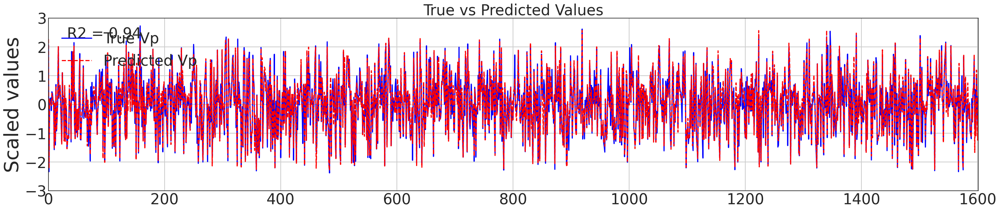

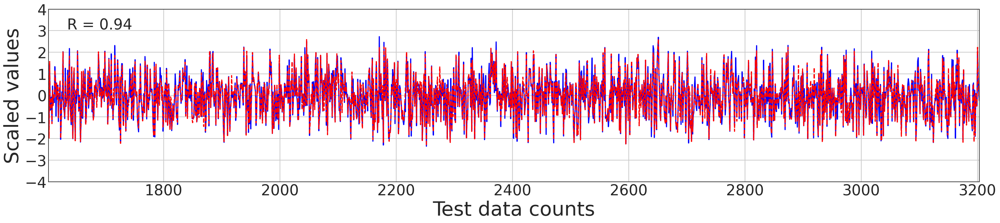

In [215]:
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming y_test and y_pred_test are defined
r2 = r2_score(y_test, y_pred_test)

# Split the data into two equal parts
half_point = len(y_test) // 2
y_test_first_half = y_test[:half_point]
y_pred_test_first_half = y_pred_test[:half_point]
y_test_second_half = y_test[half_point:]
y_pred_test_second_half = y_pred_test[half_point:]

# Create the first plot for the first half of the data
plt.figure(figsize=(30, 6))
plt.plot(range(len(y_test_first_half)), y_test_first_half, 'b-', label='True Vp')
plt.plot(range(len(y_pred_test_first_half)), y_pred_test_first_half, 'r--', label='Predicted Vp')
#plt.xlabel('Data points', fontsize=30)
plt.ylabel('Scaled values', fontsize=40)
plt.title('True vs Predicted Values', fontsize=30)
plt.ylim(-3, 3)
plt.xlim(0, len(y_test_first_half) - 1)

# Add R-squared annotation for the first half
plt.text(0.02, 0.95, f'R2 = {r2:.2f}', transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.legend(fontsize=30)
plt.grid(True)
plt.show()

# Create the second plot for the second half of the data
plt.figure(figsize=(30,6))
plt.plot(range(len(y_test_first_half), len(y_test)), y_test_second_half, 'b-')
plt.plot(range(len(y_pred_test_first_half), len(y_pred_test)), y_pred_test_second_half, 'r--')
plt.xlabel('Test data counts', fontsize=40)
plt.ylabel('Scaled values', fontsize=40)
#plt.title('True vs predicted values (1882 counts)', fontsize=30)
plt.ylim(-4, 4)
plt.xlim(len(y_test_first_half), len(y_test) - 1)

# Add R-squared annotation for the second half
plt.text(0.02, 0.95, f'R = {r2:.2f}', transform=plt.gca().transAxes, fontsize=30, verticalalignment='top')

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.legend(fontsize=30)
plt.grid(True)
plt.show()


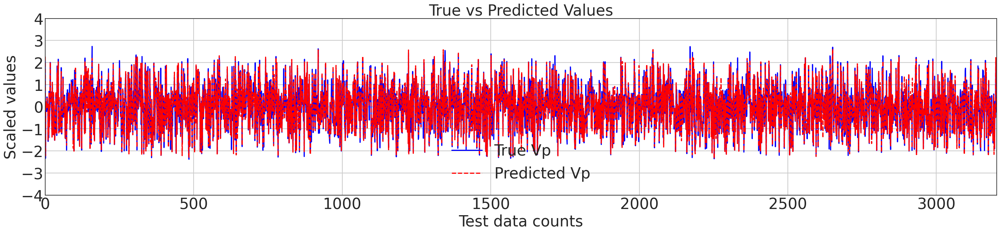

In [216]:
plt.figure(figsize=(30, 6))
plt.plot(range(len(y_test)), y_test, 'b-', label='True Vp')
plt.plot(range(len(y_pred_test)), y_pred_test, 'r--', label='Predicted Vp')
plt.xlabel('Test data counts', fontsize=30)
plt.ylabel('Scaled values', fontsize=30)
plt.title('True vs Predicted Values', fontsize=30)
plt.ylim(-4, 4)
plt.xlim(0, len(y_test) - 1)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.legend(fontsize=30)
plt.grid(True)
plt.show()

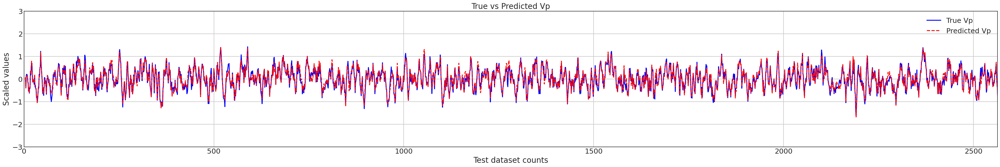

In [217]:
window_size = 5  # Adjust window size as needed
y_test_smoothed = pd.Series(y_test).rolling(window=window_size).mean()
y_pred_test_smoothed = pd.Series(y_pred_test).rolling(window=window_size).mean()

# Plot smoothed true and predicted values
plt.figure(figsize=(40, 6))
plt.plot(range(len(y_test)), y_test_smoothed, 'b-', label='True Vp')
plt.plot(range(len(y_pred_test)), y_pred_test_smoothed, 'r--', label='Predicted Vp')
plt.xlabel('Test dataset counts')
plt.ylabel('Scaled values')
plt.title('True vs Predicted Vp')
plt.ylim(-3, 3)
plt.xlim(0, 2563)
plt.legend()
plt.grid(True)
plt.show()

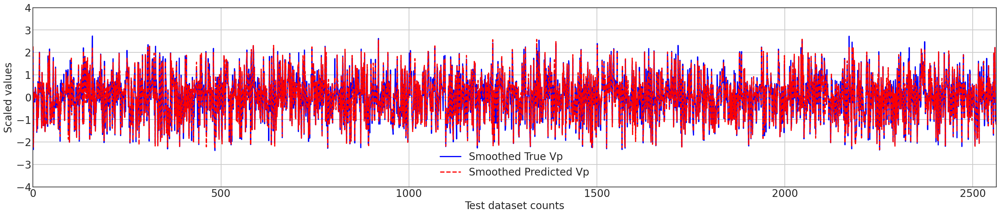

In [218]:
window_size = 1  # Adjust window size as needed
y_test_smoothed = pd.Series(y_test).rolling(window=window_size).mean()
y_pred_test_smoothed = pd.Series(y_pred_test).rolling(window=window_size).mean()

# Plot smoothed true and predicted values with y-axis limit and increased font size
plt.figure(figsize=(30, 6))
plt.plot(range(len(y_test)), y_test_smoothed, 'b-', label='Smoothed True Vp')
plt.plot(range(len(y_pred_test)), y_pred_test_smoothed, 'r--', label='Smoothed Predicted Vp')
plt.xlabel('Test dataset counts', fontsize=20)  # Increase font size for x-axis label
plt.ylabel('Scaled values', fontsize=20)  # Increase font size for y-axis label
#plt.title('Smoothed True vs Predicted Values', fontsize=16)  # Increase font size for title
plt.legend(fontsize=20)  # Increase font size for legend
plt.ylim(-4, 4)
plt.xlim(0, 2563)  # Set y-axis limit
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(True)
plt.show()

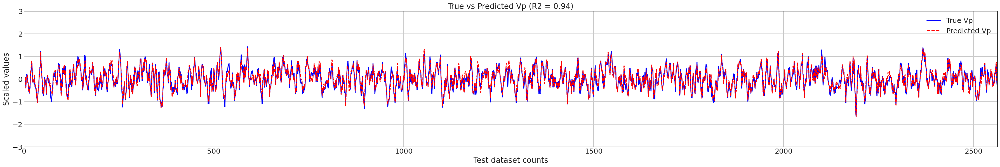

In [219]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score

# Assuming y_test and y_pred_test are defined and have 3000 elements each
window_size = 5  # Adjust window size as needed

# Smooth the data using moving average
y_test_smoothed = pd.Series(y_test).rolling(window=window_size).mean()
y_pred_test_smoothed = pd.Series(y_pred_test).rolling(window=window_size).mean()

# Calculate R-squared value
r2_smoothed = r2_score(y_test_smoothed.dropna(), y_pred_test_smoothed.dropna())  # Drop NaN values before calculating R-squared

# Plot smoothed true and predicted values
plt.figure(figsize=(40, 6))
plt.plot(range(len(y_test)), y_test_smoothed, 'b-', label='True Vp')
plt.plot(range(len(y_pred_test)), y_pred_test_smoothed, 'r--', label='Predicted Vp')
plt.xlabel('Test dataset counts')
plt.ylabel('Scaled values')
plt.title(f'True vs Predicted Vp (R2 = {r2_smoothed:.2f})')  # Display R-squared value in the title
plt.ylim(-3, 3)
plt.xlim(0, 2563)
plt.legend()
plt.grid(True)
plt.show()


#blind pred

In [220]:
well_test_norm7.size

5005

In [221]:
colms = ['GR','RHOB',	'RT',	'VSH','NPHI']
well_test_norm7 = well_test_norm7[colms].values

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [ ]:
# Assign cluster labels to test data points
cluster_labels_test = kmeans.predict(well_test_norm7)

# Initialize array to store predicted target values
y_pred_test = np.zeros(len(well_test_norm7))

# Predict target values for each test data point using the corresponding cluster-specific model
for i, x_test in enumerate(well_test_norm7):
    cluster_id = cluster_labels_test[i]  # Get the cluster label for the current test data point
    model = models[cluster_id]           # Get the corresponding cluster-specific model
    y_pred_test[i] = model.predict([x_test])  # Predict target value for the current test data point

# Print evaluation metrics
#mse = mean_squared_error(y_test, y_pred_test)
#r2 = r2_score(y_test, y_pred_test)
#mae = mean_absolute_error(y_test, y_pred_test)
#rmse = np.sqrt(mse)

#print("Evaluation Metrics:")
#print(f"Mean Squared Error: {mse:.4f}")
#print(f"R^2: {r2:.4f}")
#print(f"Mean Absolute Error: {mae:.4f}")
#print(f"Root Mean Squared Error: {rmse:.4f}")


In [ ]:
target = 'Vp'
y = well_train[target].values
scaler.fit(y.reshape(-1,1))

In [ ]:
well7_vp  = scaler.inverse_transform(y_pred_test.reshape(-1,1))
well7_vp.size

In [ ]:
Vp.size

In [ ]:
plt.scatter(Vp,well7_vp)

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(2, 16))  # Adjust the figure size as needed

# Plot true Vp values
plt.plot(Vp, well_7['DEPTH'], label='True Vp', color='blue', linestyle='-')

# Plot predicted Vp values
plt.plot(well7_vp, well_7['DEPTH'], label='Predicted Vp', color='red', linestyle='--')

plt.xlabel('Log Value', fontsize=15)
plt.ylabel('Depth', fontsize=15)
plt.title('Well_7 Vp', fontsize=20)

plt.xticks([0, 2000, 4000, 6000], fontsize=12)
plt.yticks(fontsize=12)

plt.grid(True)
plt.legend(fontsize=12)

# Show the plot
plt.show()


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 2))  # Adjust the figure size as needed

# Plot true Vp values
plt.plot(well_7['DEPTH'], Vp, label='True Vp (Castagna et al., 1985)', color='blue', linestyle='-')

# Plot predicted Vp values
plt.plot(well_7['DEPTH'], well7_vp, label='Predicted Vp', color='red', linestyle='--')

plt.xlabel('Measure depth (meter)', fontsize=15)
plt.ylabel('Vp log (m/s)', fontsize=15)
#plt.title('Well_7 Vp', fontsize=20)

plt.yticks([0, 2000, 4000, 6000], fontsize=12)
plt.xticks(fontsize=12)

plt.grid(True)
plt.legend(fontsize=12)

# Show the plot
plt.show()


# well_7_pred_clus

In [ ]:
import matplotlib.pyplot as plt

# Plot results for each cluster
for cluster_id, model in enumerate(models):
    # Filter test data points belonging to the current cluster
    cluster_X_test = X_test[clusters_test == cluster_id]
    cluster_y_test = y_test[clusters_test == cluster_id]

    if len(cluster_X_test) > 0:
        # Predict sonic log values for the current cluster
        cluster_y_pred = model.predict(cluster_X_test)

        # Plot actual vs predicted values for the current cluster
        plt.figure(figsize=(8, 6))
        plt.scatter(cluster_y_test, cluster_y_pred, color='black') # label='True vs Predicted'
        plt.plot([min(cluster_y_test), max(cluster_y_test)], [min(cluster_y_test), max(cluster_y_test)], color='red', linestyle='--', label='Linear fit')
        plt.title(f'Cluster {cluster_id+1}')
        plt.xlabel('True Vp')
        plt.ylabel('Predicted Vp')
        plt.legend()
        #plt.grid(True)
        plt.show()


In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
plt.rcParams.update({'font.size': 24})
# Plot results for each cluster
for cluster_id, model in enumerate(models):
    # Filter test data points belonging to the current cluster
    cluster_X_test = X_test[clusters_test == cluster_id]
    cluster_y_test = y_test[clusters_test == cluster_id]

    if len(cluster_X_test) > 0:
        # Predict sonic log values for the current cluster
        cluster_y_pred = model.predict(cluster_X_test)

        # Calculate R-squared value
        r2 = r2_score(cluster_y_test, cluster_y_pred)

        # Plot actual vs predicted values for the current cluster
        plt.figure(figsize=(8, 6))
        plt.scatter(cluster_y_test, cluster_y_pred, color='black') # label='True vs Predicted'
        plt.plot([min(cluster_y_test), max(cluster_y_test)], [min(cluster_y_test), max(cluster_y_test)], color='red', linestyle='--', label='Linear fit')
        plt.text(0.05, 0.88, f'R2 = {r2:.2f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top',horizontalalignment='left')  # Annotation for R-squared
        plt.title(f'Cluster {cluster_id+1}')
        plt.xlabel('True Vp')
        plt.ylabel('Predicted Vp')
        plt.legend()
        #plt.grid(True)
        plt.show()



# well_3

In [ ]:
well_test_norm3

In [ ]:
colms = ['GR','RHOB',	'RT',	'VSH','NPHI']
well_test_norm3 = well_test_norm3[colms].values

In [ ]:
# Assign cluster labels to test data points
cluster_labels_test = kmeans.predict(well_test_norm3)

# Initialize array to store predicted target values
y_pred_test = np.zeros(len(well_test_norm3))

# Predict target values for each test data point using the corresponding cluster-specific model
for i, x_test in enumerate(well_test_norm3):
    cluster_id = cluster_labels_test[i]  # Get the cluster label for the current test data point
    model = models[cluster_id]           # Get the corresponding cluster-specific model
    y_pred_test[i] = model.predict([x_test])  # Predict target value for the current test data point

In [ ]:
target = 'Vp'
y = well_train[target].values
scaler.fit(y.reshape(-1,1))

In [ ]:
well3_vp  = scaler.inverse_transform(y_pred_test.reshape(-1,1))
well3_vp.size

In [ ]:
Vp = 5.81 - (9.42 * well_3['NPHI']) - (2.21 * well_3['VSH']) #Vp (km/s)
Vp = Vp*1000
Vp

In [ ]:
plt.figure(figsize=(2, 12))
plt.plot(Vp, well_3['DEPTH'], label='True Vp', color='blue', linestyle='-')
plt.plot(well3_vp, well_3['DEPTH'], label='Predicted Vp', color='red', linestyle='--')
#plt.plot(VP, DEPTH['DEPTH'], label='(Castagna et al. (1985)', color='black', linestyle='dashdot')
# Add labels and legend
plt.gca().spines["top"].set_color("black")
plt.gca().spines["top"].set_color("black")
plt.gca().spines["bottom"].set_color("black")
plt.gca().spines["left"].set_color("black")
plt.gca().spines["right"].set_color("black")
plt.tick_params(axis='x', colors="black")
plt.xticks([2000,4000,6000])
plt.xlabel('Log Value')
plt.ylabel('Depth')
plt.title('Well_3 Vp')
plt.legend()

# Customize appearance
plt.grid(True)
#plt.gca().invert_yaxis()  # Invert y-axis to show increasing depth downwards
#plt.xlim(0, 150)
# Show the plot
plt.show()

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score

# Perform cross-validation for each cluster and compute evaluation metrics
for cluster_id, model in enumerate(models):
    # Filter data points belonging to the current cluster
    cluster_X_train = X_train[clusters_train == cluster_id]
    cluster_y_train = y_train[clusters_train == cluster_id]

    # Perform cross-validation
    cv_scores = cross_val_score(model, cluster_X_train, cluster_y_train, cv=5, scoring='neg_mean_squared_error')
    cv_mse = -cv_scores.mean()

    # Make predictions for the current cluster
    cluster_X_test = X_test[clusters_test == cluster_id]
    cluster_y_test = y_test[clusters_test == cluster_id]
    cluster_y_pred = model.predict(cluster_X_test)

    # Calculate evaluation metrics
    r2 = r2_score(cluster_y_test, cluster_y_pred)
    mse = mean_squared_error(cluster_y_test, cluster_y_pred)
    mae = mean_absolute_error(cluster_y_test, cluster_y_pred)
    rmse = np.sqrt(mse)

    # Print evaluation metrics for the current cluster
    print(f"Cluster {cluster_id+1}:")
    print(f"R^2: {r2:.2f}")
    print(f"MSE: {mse:.2f}")
    print(f"MAE: {mae:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"Cross-validated MSE: {cv_mse:.2f}")
    print()
